In [3]:
import os
import time
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mimg
from torchvision import datasets, models, transforms
import torch.nn.functional as F
import torchvision 
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import models

In [ ]:
batch_size = 128
num_workers = 4

transform = transforms.Compose([transforms.ToTensor(),                                
                                transforms.Normalize(mean=[0.5], std=[0.5]),
                                transforms.Resize(size=[int(218/2), int(178/2)]),
                                transforms.RandomRotation((-30,30)),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.CenterCrop((64,64))])

data_path = '~/data/data/celeba/train_celeba'
dataset = ImageFolder(data_path, transform)
train_loader = DataLoader(dataset=dataset,
                          batch_size=batch_size,
                          num_workers=num_workers,
                          shuffle = True,
                          drop_last = True)

data_path = '~/data/data/celeba/test_celeba'
dataset = ImageFolder(data_path, transform)

test_loader = DataLoader(dataset=dataset,
                          batch_size=batch_size,
                          num_workers=num_workers)

/home/michal/anaconda3/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow wit

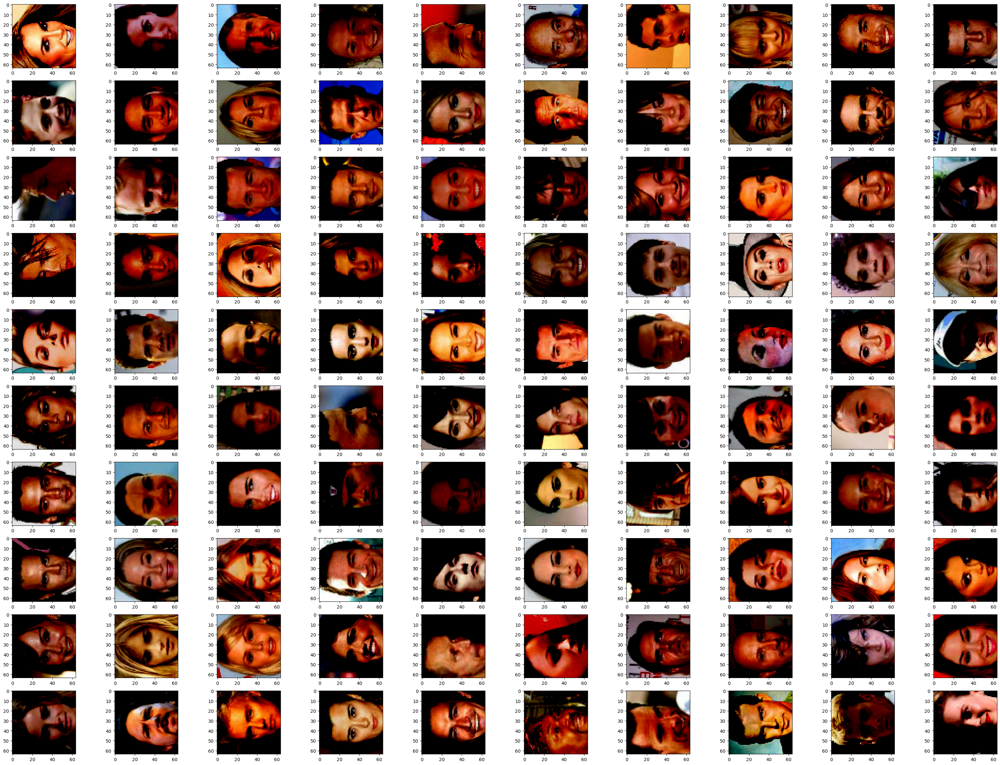

In [7]:
fig, ax  = plt.subplots(10,10, figsize=(40,30))
img = next(iter(train_loader))[0]
for i in range(10):
    for j in range(10):
        ax[i,j].imshow(img[i+10*j].numpy().T)


In [2]:
def train_vae_v1(num_epochs, model, optimizer, device, 
                 train_loader, loss_fn=None,
                 logging_interval=100, 
                 skip_epoch_stats=False,
                 reconstruction_term_weight=1,
                 save_model=None):
    
    log_dict = {'train_combined_loss_per_batch': [],
                'train_combined_loss_per_epoch': [],
                'train_reconstruction_loss_per_batch': [],
                'train_kl_loss_per_batch': []}

    if loss_fn is None:
        loss_fn = F.mse_loss

    start_time = time.time()
    for epoch in range(num_epochs):

        model.train()
        for batch_idx, (features, _) in enumerate(train_loader):

            features = features.to(device[0])

            # FORWARD AND BACK PROP
            encoded, z_mean, z_log_var, decoded = model(features)
            
            kl_div = -0.5 * torch.sum(1 + z_log_var 
                                      - z_mean**2 
                                      - torch.exp(z_log_var) ,
                                      axis=1).to('cuda:0') # sum over latent dimension

            batchsize = kl_div.size(0)
            kl_div = kl_div.mean() # average over batch dimension

            pixelwise = loss_fn(decoded, features.to('cuda:0'), reduction='none')
            pixelwise = pixelwise.view(batchsize, -1).sum(axis=1) # sum over pixels
            pixelwise = pixelwise.mean().to('cuda:0') # average over batch dimension
            loss = reconstruction_term_weight*pixelwise + kl_div
            
            optimizer.zero_grad()

            loss.backward()

            # UPDATE MODEL PARAMETERS
            optimizer.step()

            # LOGGING
            log_dict['train_combined_loss_per_batch'].append(loss.item())
            log_dict['train_reconstruction_loss_per_batch'].append(pixelwise.item())
            log_dict['train_kl_loss_per_batch'].append(kl_div.item())
            if not batch_idx % logging_interval:
                print('Epoch: %03d/%03d | Batch %04d/%04d | Loss: %.4f'
                      % (epoch+1, num_epochs, batch_idx,
                          len(train_loader), loss))

        if not skip_epoch_stats:
            model.eval()
            
            with torch.set_grad_enabled(False):  # save memory during inference
                
                train_loss = compute_epoch_loss_autoencoder(
                    model, train_loader, loss_fn, device)
                print('***Epoch: %03d/%03d | Loss: %.3f' % (
                      epoch+1, num_epochs, train_loss))
                log_dict['train_combined_per_epoch'].append(train_loss.item())

        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))
        fig, ax = plt.subplots(10,10, figsize=(64, 48))
        img = decoded.detach().cpu().numpy()
        img1 = features.detach().cpu().numpy()
        for i in range(5):
            for j in range(10):
                ax[j,i].imshow(img1[i+10*j].T)
                ax[j,i+5].imshow(img[i+10*j].T)
        plt.show()
    
    print('Total Training Time: %.2f min' % ((time.time() - start_time)/60))
    if save_model is not None:
        torch.save(model.state_dict(), save_model)
    
    return log_dict

In [5]:
def train_gan_v1(num_epochs, model,
                 latent_dim, device, train_loader, loss_fn=None,
                 logging_interval=100, b=128,
                 save_model=None):
    print("training1")
    log_dict = {'train_generator_loss_per_batch': [],
                'train_discriminator_loss_per_batch': [],
                'train_discriminator_real_acc_per_batch': [],
                'train_discriminator_fake_acc_per_batch': [],
                'images_from_noise_per_epoch': []}
    
    torch.autograd.set_detect_anomaly(True)
    
    if loss_fn is None:
        loss_fn = F.binary_cross_entropy_with_logits

    # Batch of latent (noise) vectors for
    # evaluating / visualizing the training progress
    # of the generator
    lr = 0.0001
    start_time = time.time()
    fixed_noise = torch.randn(next(iter(train_loader))[0].size()[0], latent_dim, 1, 1,  device=device[0])  # format NCHW
    for epoch in range(num_epochs):
#         if(epoch<=int(num_epochs/2)-1):
#             lr+=0.00005
#         else:
#             lr-=0.00005
            
        optimizer_discr  = torch.optim.Adam(model.discriminator.parameters(),
                                       betas=(0.5, 0.999),
                                       lr=lr)

        optimizer_gen = torch.optim.Adam(model.generator.parameters(),
                                     betas=(0.5, 0.999),
                                     lr=lr)

        model.train()
        for batch_idx, (features,_) in enumerate(train_loader):
            batch_size = features.size(0)
            # batch_size = np.shape(next(iter(features))[1])

            # real images
            real_images = features.to(device[1])
            real_labels = torch.ones(batch_size, device=device[1]) # real label = 1

            # generated (fake) images
            noise = torch.randn(batch_size, latent_dim, 1, 1,  device=device[0])  # format NCHW
            fake_images = model.generator_forward(noise)
            fake_labels = torch.zeros(batch_size, device=device[1]) # fake label = 0
            flipped_fake_labels = real_labels # here, fake label = 1

            # --------------------------
            # Train Discriminator
            # --------------------------

            optimizer_discr.zero_grad()

            # get discriminator loss on real images
            discr_pred_real = model.discriminator_forward(real_images).view(-1) # Nx1 -> N
            real_loss = loss_fn(discr_pred_real, real_labels)
            # real_loss.backward()

            # get discriminator loss on fake images
            discr_pred_fake = model.discriminator_forward(fake_images.to(device[1])).view(-1)
            fake_loss = loss_fn(discr_pred_fake, fake_labels)
            # fake_loss.backward()

            # combined loss
            
            discr_loss = 0.5*(real_loss + fake_loss)
            
            ###uncomment durring dicriminator trainning!!!
            
            discr_loss.backward(retain_graph=True)

            optimizer_discr.step()

            # --------------------------
            # Train Generator
            # --------------------------

            optimizer_gen.zero_grad()

            # get discriminator loss on fake images with flipped labels
            discr_pred_fake = model.discriminator_forward(fake_images.to(device[1])).view(-1)
            gener_loss = loss_fn(discr_pred_fake, flipped_fake_labels)
            gener_loss.backward(retain_graph=True)

            optimizer_gen.step()
            
            # --------------------------
            # Logging
            # --------------------------   
            log_dict['train_generator_loss_per_batch'].append(gener_loss.item())
            log_dict['train_discriminator_loss_per_batch'].append(discr_loss.item())
            
            predicted_labels_real = torch.where(discr_pred_real.detach() > 0., 1., 0.)
            predicted_labels_fake = torch.where(discr_pred_fake.detach() > 0., 1., 0.)
            acc_real = (predicted_labels_real == real_labels).float().mean()*100.
            acc_fake = (predicted_labels_fake == fake_labels).float().mean()*100.
            log_dict['train_discriminator_real_acc_per_batch'].append(acc_real.item())
            log_dict['train_discriminator_fake_acc_per_batch'].append(acc_fake.item())         
            if not batch_idx % logging_interval:
                print('Epoch: %03d/%03d | Batch %03d/%03d | Gen/Dis Loss: %.4f/%.4f' 
                       % (epoch+1, num_epochs, batch_idx, 
                          len(train_loader), gener_loss.item(), discr_loss.item()))
            
        ### Save images for evaluation
#         with torch.no_grad():
#             fake_images = model.generator_forward(fixed_noise).detach().cpu()
#             log_dict['images_from_noise_per_epoch'].append(
#                 torchvision.utils.make_grid(fake_images, padding=2, normalize=True))
        fake_images = model.generator_forward(fixed_noise)
        y = model.discriminator_forward(fake_images.to('cuda:0')).detach().cpu().numpy()
        fake_images = fake_images.detach().cpu().numpy()
        print(len(y))
        print(batch_size)
        a = np.append(y.T, [np.arange(128).astype(np.int32)],axis=0).T.tolist()
        a.sort(key = lambda x: x[0])
        a = a[::-1]
        np.array(a).T[1].astype(np.int)
        aa = np.array(a).T[0].astype(np.float16)
        img1 = fake_images[np.array(a).T[1].astype(np.int)]
        fig, ax = plt.subplots(10,10, figsize=(64, 48))
        for i in range(10):
            for j in range(10):
                ax[j,i].imshow(img1[i+10*j].T)
                ax[j,i].set_title(aa[i+10*j].T)
        plt.show()
        print('lol')
        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))

        
    print('Total Training Time: %.2f min' % ((time.time() - start_time)/60))
    
    if save_model is not None:
        torch.save(model.state_dict(), save_model)
    
    return log_dict


In [6]:
def train_vae_gan_v1(num_epochs, model,
                  device, train_loader, loss_fn=None,
                 logging_interval=100, b=128,
                 reconstruction_term_weight=1,
                 v_t_g=1, #vae to gan weight
                 save_model=None):
    print("training1")
    log_dict = {'train_generator_loss_per_batch': [],
                'train_discriminator_loss_per_batch': [],
                'train_discriminator_real_acc_per_batch': [],
                'train_discriminator_fake_acc_per_batch': [],
                'images_from_noise_per_epoch': []}
    
    torch.autograd.set_detect_anomaly(True)
    
    if loss_fn is None:
        loss_fn = F.binary_cross_entropy_with_logits

    # Batch of latent (noise) vectors for
    # evaluating / visualizing the training progress
    # of the generator
    lr = 0.0001
    start_time = time.time()
    for epoch in range(num_epochs):
#         if(epoch<=int(num_epochs/2)-1):
#             lr+=0.00005
#         else:
#             lr-=0.00005
            
        optimizer_discr  = torch.optim.Adam(model.discriminator.parameters(),
                                       betas=(0.5, 0.999),
                                       lr=lr)

        optimizer_gen = torch.optim.Adam(model.generator.parameters(),
                                     betas=(0.5, 0.999),
                                     lr=lr)

        model.train()
        for batch_idx, (features,_) in enumerate(train_loader):
            batch_size = features.size(0)
            # batch_size = np.shape(next(iter(features))[1])
            # real images
            real_images = features.to(device[1])
            real_labels = torch.ones(batch_size, device=device[1]) # real label = 1

            # generated (fake) images
            # noise = torch.randn(batch_size, latent_dim, 1, 1,  device=device[0])  # format NCHW
            encoded, z_mean, z_log_var,fake_images = model.generator_forward(features.to(device[0]))
            fake_labels = torch.zeros(batch_size, device=device[1]) # fake label = 0
            flipped_fake_labels = real_labels # here, fake label = 1
            
            # --------------------------
            # Train Discriminator
            # --------------------------
            optimizer_discr.zero_grad()

            # get discriminator loss on real images
            discr_pred_real = model.discriminator_forward(real_images).view(-1) # Nx1 -> N
            real_loss = loss_fn(discr_pred_real, real_labels)
            # real_loss.backward()

            # get discriminator loss on fake images
            discr_pred_fake = model.discriminator_forward(fake_images.to(device[1])).view(-1)
            fake_loss = loss_fn(discr_pred_fake, fake_labels)
            # fake_loss.backward()

            # combined loss
            
            discr_loss = 0.5*(real_loss + fake_loss)
            
            ###uncomment durring discriminator trainning!!!
            
            discr_loss.backward(retain_graph=True)

            optimizer_discr.step()

            # --------------------------
            # Train Generator
            # --------------------------

            optimizer_gen.zero_grad()

            kl_div = -0.5 * torch.sum(1 + z_log_var 
                                    - z_mean**2 
                                    - torch.exp(z_log_var), 
                                    axis=1).to(device[0]) # sum over latent dimension

            batchsize = kl_div.size(0)
            kl_div = kl_div.mean() # average over batch dimension

            pixelwise = loss_fn(fake_images, features.to(device[0]), reduction='none')
            pixelwise = pixelwise.view(batchsize, -1).sum(axis=1) # sum over pixels
            pixelwise = pixelwise.mean().to(device[0]) # average over batch dimension
            loss = reconstruction_term_weight*pixelwise + kl_div
            

            # loss.backward(retain_graph=True)

            # UPDATE MODEL PARAMETERS
            # get discriminator loss on fake images with flipped labels

            discr_pred_fake = model.discriminator_forward(fake_images.to(device[1])).view(-1)
            gener_loss = loss_fn(discr_pred_fake, flipped_fake_labels)

            gener_loss.backward(retain_graph=True)

            optimizer_gen.step()
            
            # --------------------------
            # Logging
            # --------------------------   
            log_dict['train_generator_loss_per_batch'].append(gener_loss.item())
            log_dict['train_discriminator_loss_per_batch'].append(discr_loss.item())
            
            predicted_labels_real = torch.where(discr_pred_real.detach() > 0., 1., 0.)
            predicted_labels_fake = torch.where(discr_pred_fake.detach() > 0., 1., 0.)
            acc_real = (predicted_labels_real == real_labels).float().mean()*100.
            acc_fake = (predicted_labels_fake == fake_labels).float().mean()*100.
            log_dict['train_discriminator_real_acc_per_batch'].append(acc_real.item())
            log_dict['train_discriminator_fake_acc_per_batch'].append(acc_fake.item())         
            if not batch_idx % logging_interval:
                print('Epoch: %03d/%03d | Batch %03d/%03d | Gen/Dis Loss: %.4f/%.4f' 
                       % (epoch+1, num_epochs, batch_idx, 
                          len(train_loader), gener_loss.item(), discr_loss.item()))
            
        ### Save images for evaluation
#         with torch.no_grad():
#             fake_images = model.generator_forward(fixed_noise).detach().cpu()
#             log_dict['images_from_noise_per_epoch'].append(
#                 torchvision.utils.make_grid(fake_images, padding=2, normalize=True))
        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))
        fig, ax = plt.subplots(10,10, figsize=(64, 48))
        img = fake_images.detach().cpu().numpy()
        img1 = features.detach().cpu().numpy()
        for i in range(5):
            for j in range(10):
                ax[j,i].imshow(img1[i+10*j].T)
                ax[j,i+5].imshow(img[i+10*j].T)
        plt.show()
        print('lol')
        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))

        
    print('Total Training Time: %.2f min' % ((time.time() - start_time)/60))
    
    if save_model is not None:
        torch.save(model.state_dict(), save_model)
    
    return log_dict


In [3]:
##########################
### MODEL
##########################

class VAE1(torch.nn.Module):

    def __init__(self, latent_dim=100, 
                 num_feat_maps_gen=64, num_feat_maps_dis=64,
                 color_channels=3):
        super().__init__()
        
        self.latent_dim = latent_dim        
        
        self.generator_1 = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, num_feat_maps_gen*8, 
                               kernel_size=4, stride=1, padding=0,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*8),
            nn.LeakyReLU(inplace=True)
        )
            #
            # size if latent_dim=100: num_feat_maps_gen*8 x 4 x 4
            #
        self.generator_2 = nn.Sequential(
            nn.ConvTranspose2d(num_feat_maps_gen*8, num_feat_maps_gen*8, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*8),
            nn.LeakyReLU(inplace=True),
        )
        self.generator_3 = nn.Sequential(
            nn.ConvTranspose2d(num_feat_maps_gen*8, num_feat_maps_gen*4, 
                               kernel_size=3, stride=1, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*4),
            nn.LeakyReLU(inplace=True),
            #
        )
        
        self.discriminator_1 = nn.Sequential(
            nn.Conv2d(num_feat_maps_dis*4, num_feat_maps_dis*8,
                      kernel_size=4, stride=2, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*8),
            nn.LeakyReLU(inplace=True),
        )
        self.discriminator_2 = nn.Sequential(
            nn.Conv2d(num_feat_maps_dis*8, num_feat_maps_dis*8,
                      kernel_size=3, stride=1, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*8),
            nn.LeakyReLU(inplace=True),
        )
        self.discriminator_3 = nn.Sequential(
            nn.Conv2d(num_feat_maps_dis*8, latent_dim,
                      kernel_size=4, stride=1, padding=0),
            #
            # size: num_feat_maps_dis*8 x 4 x 4
            #
            
        )
        self.generator1 = nn.Sequential(
                    self.generator_1,
                    self.generator_2,
                    self.generator_3,
        )
        self.discriminator1 = nn.Sequential(
                    self.discriminator_1,
                    self.discriminator_2,
                    self.discriminator_3,
        )
        self.decoder = nn.Sequential(
            # self.generator_1, 
            self.generator1,
            nn.ConvTranspose2d(num_feat_maps_gen*4, color_channels, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            #
            # size: color_channels x 64 x 64
            #  
            nn.Tanh()
        )
        self.encoder = nn.Sequential(    

            #
            # input size color_channels x image_height x image_width
            #
            nn.Conv2d(color_channels, num_feat_maps_dis*4,
                      kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(inplace=True),
            
            self.discriminator1,
            
            # size: 1 x 1 x 1
            nn.Flatten(),
        )

        self.z_mean = torch.nn.Linear(self.latent_dim,self.latent_dim)
        self.z_log_var = torch.nn.Linear(self.latent_dim,self.latent_dim)

    def encoding_fn(self, x):
        x = self.encoder(x)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        return encoded

        
    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to('cuda:0')
        z = z_mu + eps * torch.exp(z_log_var/2.)
        return z
        
        
    def forward(self, x):
        x = self.encoder(x)
        x = x.reshape(x.size(0),1,1,self.latent_dim)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        x = x.reshape(x.size(0),self.latent_dim,1,1)
        decoded = self.decoder(x)
        return encoded, z_mean, z_log_var, decoded



In [4]:
##########################
### MODEL
##########################

class VAE2(torch.nn.Module):

    def __init__(self, latent_dim=100, 
                 num_feat_maps_gen=64, num_feat_maps_dis=64,
                 color_channels=3, gan1=None):
        super().__init__()
        self.latent_dim = latent_dim
        
        if gan1 == None:
            self.gan1 = VAE1(latent_dim=latent_dim)
        else:
            self.gan1 = gan1
        
        self.generator1 = nn.Sequential(
            self.gan1.generator1,
            #
            # size if latent_dim=100: num_feat_maps_gen*4 x 8 x 8
            #
            nn.ConvTranspose2d(num_feat_maps_gen*4, num_feat_maps_gen*4, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*4),
            nn.LeakyReLU(inplace=True),
            nn.ConvTranspose2d(num_feat_maps_gen*4, num_feat_maps_gen*2, 
                               kernel_size=3, stride=1, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*2),
            nn.LeakyReLU(inplace=True),
        )
        
        self.discriminator1 = nn.Sequential(
            nn.Conv2d(num_feat_maps_dis*2, num_feat_maps_dis*4,
                      kernel_size=4, stride=2, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*4),
            nn.LeakyReLU(inplace=True),   
            nn.Conv2d(num_feat_maps_dis*4, num_feat_maps_dis*4,
                      kernel_size=3, stride=1, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*4),
            nn.LeakyReLU(inplace=True),
            #
            # size: num_feat_maps_dis*4 x 8 x 8
            #  
            self.gan1.discriminator1,
            #
            # size: num_feat_maps_dis*8 x 4 x 4
            #
            
        )

        
        self.decoder = nn.Sequential(
            self.generator1,
            nn.ConvTranspose2d(num_feat_maps_gen*2, color_channels, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            #
            # size: color_channels x 64 x 64
            #  
            nn.Tanh()
        )
        self.encoder = nn.Sequential(    

            #
            # input size color_channels x image_height x image_width
            #
            nn.Conv2d(color_channels, num_feat_maps_dis*2,
                      kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(inplace=True),
            
            self.discriminator1,

            # nn.Conv2d(num_feat_maps_dis*8, 100,
            #           kernel_size=4, stride=1, padding=0),
            
            # size: 1 x 1 x 1
            nn.Flatten(),
        )
        
        self.z_mean = self.gan1.z_mean 
        # torch.nn.Linear(100,100)
        # .to('cuda:0')
        self.z_log_var = self.gan1.z_log_var
        # torch.nn.Linear(100,100)
        # .to('cuda:0')

    def encoding_fn(self, x):
        x = self.encoder(x)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        return encoded

        
    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to('cuda:0')
        z = z_mu + eps * torch.exp(z_log_var/2.)
        return z
        
        
    def forward(self, x):
        x = self.encoder(x)
        x = x.reshape(x.size(0),1,1,self.latent_dim)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        x = x.reshape(x.size(0),self.latent_dim,1,1)
        decoded = self.decoder(x)
        return encoded, z_mean, z_log_var, decoded


In [25]:
##########################
### MODEL
##########################

class VUNET(torch.nn.Module):

    def __init__(self, latent_dim=100, 
                 num_feat_maps_gen=64, num_feat_maps_dis=64,
                 color_channels=3, gan1=None):
        super().__init__()
        if gan1 == None:
            self.gan1 = VAE1()
        else:
            self.gan1 = gan1

        self.c1 = nn.Conv2d(128*2,128,4,2,1)
        self.c2 = nn.Conv2d(128,100,2,1,0)
        self.m = nn.MaxPool2d(2)        
        self.cT1 = nn.ConvTranspose2d(100,128,4,1,0)
        self.cT2 = nn.ConvTranspose2d(128,256,4,2,1)

        self.generator2 = nn.Sequential(
            # self.gan1.generator1,
            #
            # size if latent_dim=100: num_feat_maps_gen*4 x 8 x 8
            #
            nn.ConvTranspose2d(num_feat_maps_gen*4, num_feat_maps_gen*4, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*4),
            nn.LeakyReLU(inplace=True),
            nn.ConvTranspose2d(num_feat_maps_gen*4, num_feat_maps_gen*2, 
                               kernel_size=3, stride=1, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*2),
            nn.LeakyReLU(inplace=True),
        )
        
        self.discriminator2 = nn.Sequential(
            nn.Conv2d(num_feat_maps_dis*2, num_feat_maps_dis*4,
                      kernel_size=4, stride=2, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*4),
            nn.LeakyReLU(inplace=True),   
            nn.Conv2d(num_feat_maps_dis*4, num_feat_maps_dis*4,
                      kernel_size=3, stride=1, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*4),
            nn.LeakyReLU(inplace=True),
            #
            # size: num_feat_maps_dis*4 x 8 x 8
            #  
            #
            # size: num_feat_maps_dis*8 x 4 x 4
            #
        )

        
        self.decoder = nn.Sequential(
            self.generator2,
            nn.ConvTranspose2d(num_feat_maps_gen*2, color_channels, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            #
            # size: color_channels x 64 x 64
            #  
            nn.Tanh()
        )
        self.encoder = nn.Sequential(    

            #
            # input size color_channels x image_height x image_width
            #
            nn.Conv2d(color_channels, num_feat_maps_dis*2,
                      kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(inplace=True),
            
            self.discriminator2,

            # nn.Conv2d(num_feat_maps_dis*4, num_feat_maps_dis*4,
            #           kernel_size=4, stride=1, padding=0),
            
            # size: 1 x 1 x 1
            # nn.Flatten(),
        )
        
        self.z_mean = torch.nn.Linear(100,100).to('cuda:0')
        self.z_log_var = torch.nn.Linear(100,100).to('cuda:0')

    def encoding_fn(self, x):
        x = self.encoder(x)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        return encoded

         
    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to('cuda:0')
        z = z_mu + eps * torch.exp(z_log_var/2.)
        return z
        
        
    def forward(self, x):
        x = self.encoder(x)
        identity = x
        identity = self.gan1.generator1(self.gan1.discriminator1(identity))
        x = self.m(x) 
        x = self.c1(x) 
        x = self.c2(x) 
        x = x.reshape(x.size(0),1,1,100)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        x = x.reshape(x.size(0),100,1,1)
        encoded = self.reparameterize(z_mean, z_log_var)
        x = self.cT1(x)
        x = self.cT2(x)
        x += identity
        
        decoded = self.decoder(x)
        return encoded, z_mean, z_log_var, decoded


In [86]:
##########################
### MODEL
##########################

class VAE3(torch.nn.Module):

    def __init__(self, latent_dim=100, 
                 num_feat_maps_gen=64, num_feat_maps_dis=64,
                 color_channels=3, gan1=None):
        super().__init__()
        self.latent_dim = latent_dim
        
        if gan1 == None:
            self.gan1 = VAE2(latent_dim=latent_dim)
        else:
            self.gan1 = gan1
        
        self.generator1 = nn.Sequential(
            self.gan1.generator1,
            #
            # size if latent_dim=100: num_feat_maps_gen*4 x 8 x 8
            #
            nn.ConvTranspose2d(num_feat_maps_gen*2, num_feat_maps_gen*4, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*4),
            nn.LeakyReLU(inplace=True),
            nn.ConvTranspose2d(num_feat_maps_gen*4, num_feat_maps_gen*2, 
                               kernel_size=3, stride=1, padding=1,
                               bias=False),
            nn.BatchNorm2d(num_feat_maps_gen*2),
            nn.LeakyReLU(inplace=True),
        )
        
        self.discriminator1 = nn.Sequential(
            nn.Conv2d(num_feat_maps_dis*2, num_feat_maps_dis*4,
                      kernel_size=4, stride=2, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*4),
            nn.LeakyReLU(inplace=True),   
            nn.Conv2d(num_feat_maps_dis*4, num_feat_maps_dis*2,
                      kernel_size=3, stride=1, padding=1,
                      bias=False),        
            nn.BatchNorm2d(num_feat_maps_dis*2),
            nn.LeakyReLU(inplace=True),
            #
            # size: num_feat_maps_dis*4 x 8 x 8
            #  
            self.gan1.discriminator1,
            #
            # size: num_feat_maps_dis*8 x 4 x 4
            #
            
        )

        
        self.decoder = nn.Sequential(
            self.generator1,
            nn.ConvTranspose2d(num_feat_maps_gen*2, color_channels, 
                               kernel_size=4, stride=2, padding=1,
                               bias=False),
            #
            # size: color_channels x 64 x 64
            #  
            nn.Tanh()
        )
        self.encoder = nn.Sequential(    

            #
            # input size color_channels x image_height x image_width
            #
            nn.Conv2d(color_channels, num_feat_maps_dis*2,
                      kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(inplace=True),
            
            self.discriminator1,

            # nn.Conv2d(num_feat_maps_dis*8, 100,
            #           kernel_size=4, stride=1, padding=0),
            
            # size: 1 x 1 x 1
            nn.Flatten(),
        )
        
        self.z_mean = self.gan1.z_mean 
        # torch.nn.Linear(100,100)
        # .to('cuda:0')
        self.z_log_var = self.gan1.z_log_var
        # torch.nn.Linear(100,100)
        # .to('cuda:0')

    def encoding_fn(self, x):
        x = self.encoder(x)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        return encoded

        
    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to('cuda:0')
        z = z_mu + eps * torch.exp(z_log_var/2.)
        return z
        
        
    def forward(self, x):
        x = self.encoder(x)
        x = x.reshape(x.size(0),1,1,self.latent_dim)
        z_mean, z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        x = x.reshape(x.size(0),self.latent_dim,1,1)
        decoded = self.decoder(x)
        return encoded, z_mean, z_log_var, decoded


In [83]:
model

VAE3(
  (gan1): VAE2(
    (gan1): VAE1(
      (generator_1): Sequential(
        (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
      )
      (generator_2): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
      )
      (generator_3): Sequential(
        (0): ConvTranspose2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
      )
      (discriminator_1): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), stri

In [82]:
model = VAE3().to('cuda:0')
model(torch.randn(5,3,64,64).to('cuda:0'))[3].size()

torch.Size([5, 100])


torch.Size([5, 3, 64, 64])

Epoch: 001/002 | Batch 0000/1582 | Loss: 662.9208
Epoch: 001/002 | Batch 0050/1582 | Loss: 82.0989
Epoch: 001/002 | Batch 0100/1582 | Loss: 57.0117
Epoch: 001/002 | Batch 0150/1582 | Loss: 46.6869
Epoch: 001/002 | Batch 0200/1582 | Loss: 41.8033
Epoch: 001/002 | Batch 0250/1582 | Loss: 36.6512
Epoch: 001/002 | Batch 0300/1582 | Loss: 31.6045
Epoch: 001/002 | Batch 0350/1582 | Loss: 33.0880
Epoch: 001/002 | Batch 0400/1582 | Loss: 30.3207
Epoch: 001/002 | Batch 0450/1582 | Loss: 29.5838
Epoch: 001/002 | Batch 0500/1582 | Loss: 26.1907
Epoch: 001/002 | Batch 0550/1582 | Loss: 25.6402
Epoch: 001/002 | Batch 0600/1582 | Loss: 27.9890
Epoch: 001/002 | Batch 0650/1582 | Loss: 24.3670
Epoch: 001/002 | Batch 0700/1582 | Loss: 25.9164
Epoch: 001/002 | Batch 0750/1582 | Loss: 23.6673
Epoch: 001/002 | Batch 0800/1582 | Loss: 21.4746
Epoch: 001/002 | Batch 0850/1582 | Loss: 18.3700
Epoch: 001/002 | Batch 0900/1582 | Loss: 20.9943
Epoch: 001/002 | Batch 0950/1582 | Loss: 20.2582
Epoch: 001/002 | Ba

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

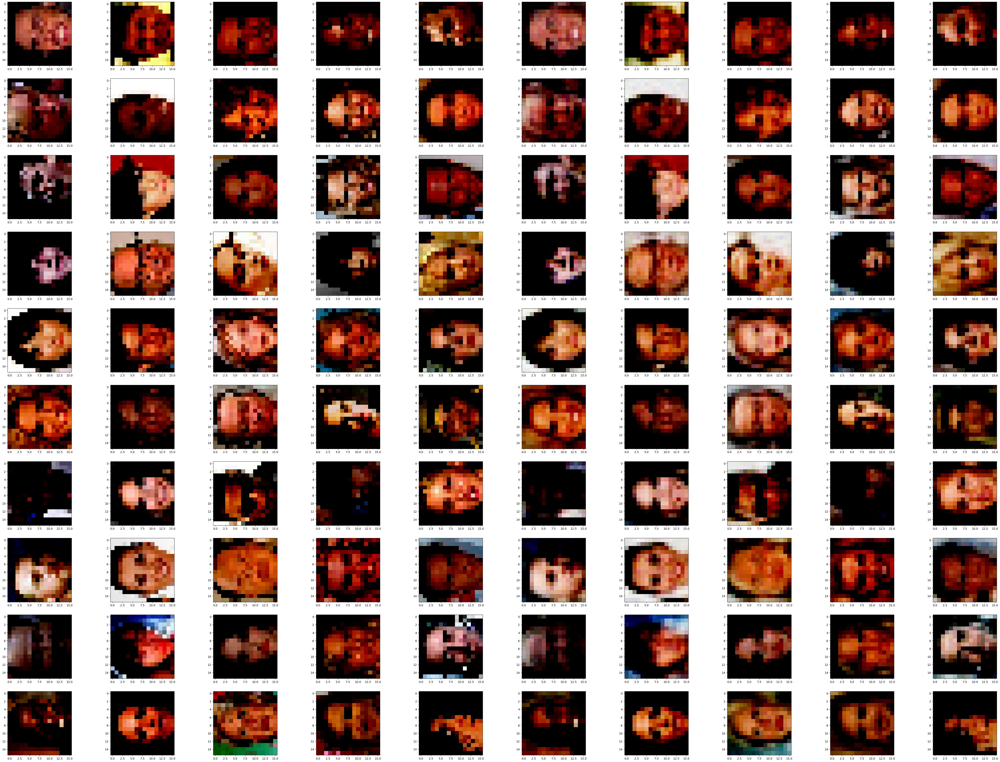

Epoch: 002/002 | Batch 0000/1582 | Loss: 18.7454
Epoch: 002/002 | Batch 0050/1582 | Loss: 16.9899
Epoch: 002/002 | Batch 0100/1582 | Loss: 17.9118
Epoch: 002/002 | Batch 0150/1582 | Loss: 18.4173
Epoch: 002/002 | Batch 0200/1582 | Loss: 18.0449
Epoch: 002/002 | Batch 0250/1582 | Loss: 17.2931
Epoch: 002/002 | Batch 0300/1582 | Loss: 15.5564
Epoch: 002/002 | Batch 0350/1582 | Loss: 17.6217
Epoch: 002/002 | Batch 0400/1582 | Loss: 17.2618
Epoch: 002/002 | Batch 0450/1582 | Loss: 17.0934
Epoch: 002/002 | Batch 0500/1582 | Loss: 16.4134
Epoch: 002/002 | Batch 0550/1582 | Loss: 16.6155
Epoch: 002/002 | Batch 0600/1582 | Loss: 19.6762
Epoch: 002/002 | Batch 0650/1582 | Loss: 16.3294
Epoch: 002/002 | Batch 0700/1582 | Loss: 17.9502
Epoch: 002/002 | Batch 0750/1582 | Loss: 17.0625
Epoch: 002/002 | Batch 0800/1582 | Loss: 16.4856
Epoch: 002/002 | Batch 0850/1582 | Loss: 14.4744
Epoch: 002/002 | Batch 0900/1582 | Loss: 16.5354
Epoch: 002/002 | Batch 0950/1582 | Loss: 16.1549
Epoch: 002/002 | Bat

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

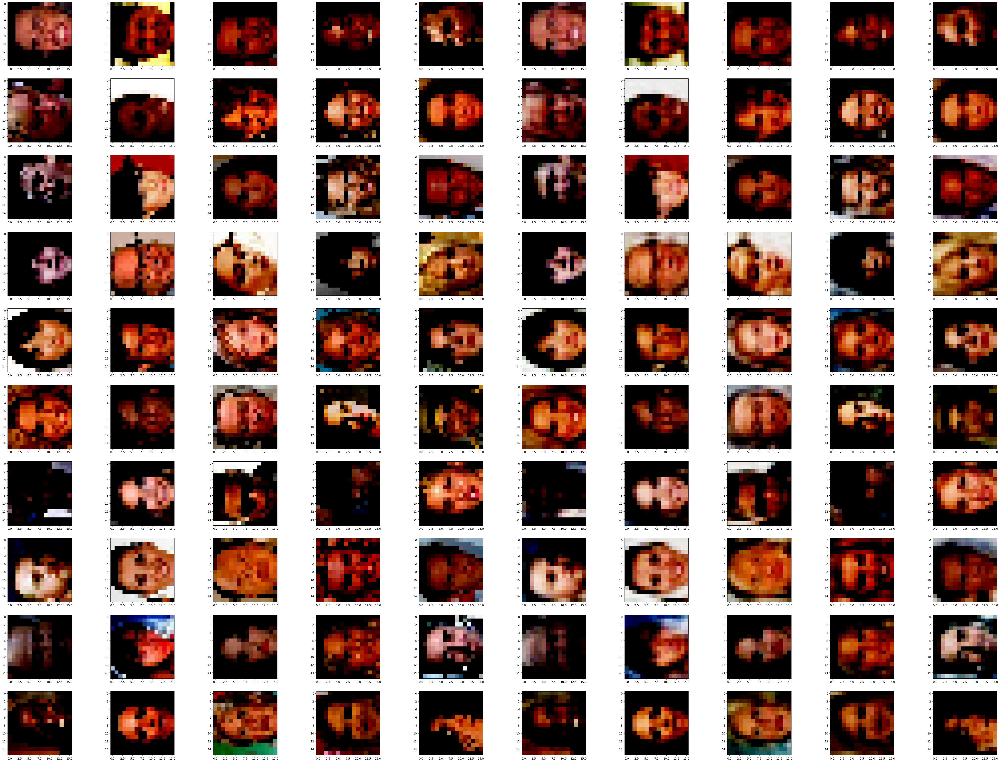

Total Training Time: 14.58 min
END OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAE


In [101]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=2
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001
model=VAE1().to('cuda:0')
# model.to(DEVICE)


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')
model1=model



In [102]:

torch.save(model.state_dict(), './vae1_1.pt')

In [103]:
# modeltorch.'./vae1_1.pt')


<All keys matched successfully>

In [2]:
batch_size = 128
num_workers = 4

transform = transforms.Compose([transforms.ToTensor(),                                
                                transforms.Normalize(mean=[0.5], std=[0.5]),
                                transforms.Resize(size=[int(218/4), int(178/4)]),
                                transforms.CenterCrop((32,32))])

data_path = '../googlenet-main/data/celeba'

dataset = ImageFolder(data_path, transform)
train_loader = DataLoader(dataset=dataset,
                          batch_size=batch_size,
#                           num_workers=num_workers,
                          drop_last=True,)


In [12]:
model.encoder(torch.randn(5,3,32,32).to('cuda:0')).size()

torch.Size([5, 1000])

Epoch: 001/002 | Batch 0000/1582 | Loss: 2424.2463
Epoch: 001/002 | Batch 0050/1582 | Loss: 438.2825
Epoch: 001/002 | Batch 0100/1582 | Loss: 288.1935
Epoch: 001/002 | Batch 0150/1582 | Loss: 232.5622
Epoch: 001/002 | Batch 0200/1582 | Loss: 210.9668
Epoch: 001/002 | Batch 0250/1582 | Loss: 185.2612
Epoch: 001/002 | Batch 0300/1582 | Loss: 163.2247
Epoch: 001/002 | Batch 0350/1582 | Loss: 171.0072
Epoch: 001/002 | Batch 0400/1582 | Loss: 154.8650
Epoch: 001/002 | Batch 0450/1582 | Loss: 162.9034
Epoch: 001/002 | Batch 0500/1582 | Loss: 137.3559
Epoch: 001/002 | Batch 0550/1582 | Loss: 139.7664
Epoch: 001/002 | Batch 0600/1582 | Loss: 132.4725
Epoch: 001/002 | Batch 0650/1582 | Loss: 127.6859
Epoch: 001/002 | Batch 0700/1582 | Loss: 139.0457
Epoch: 001/002 | Batch 0750/1582 | Loss: 124.8097
Epoch: 001/002 | Batch 0800/1582 | Loss: 118.3746
Epoch: 001/002 | Batch 0850/1582 | Loss: 109.8936
Epoch: 001/002 | Batch 0900/1582 | Loss: 114.2146
Epoch: 001/002 | Batch 0950/1582 | Loss: 114.6073

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

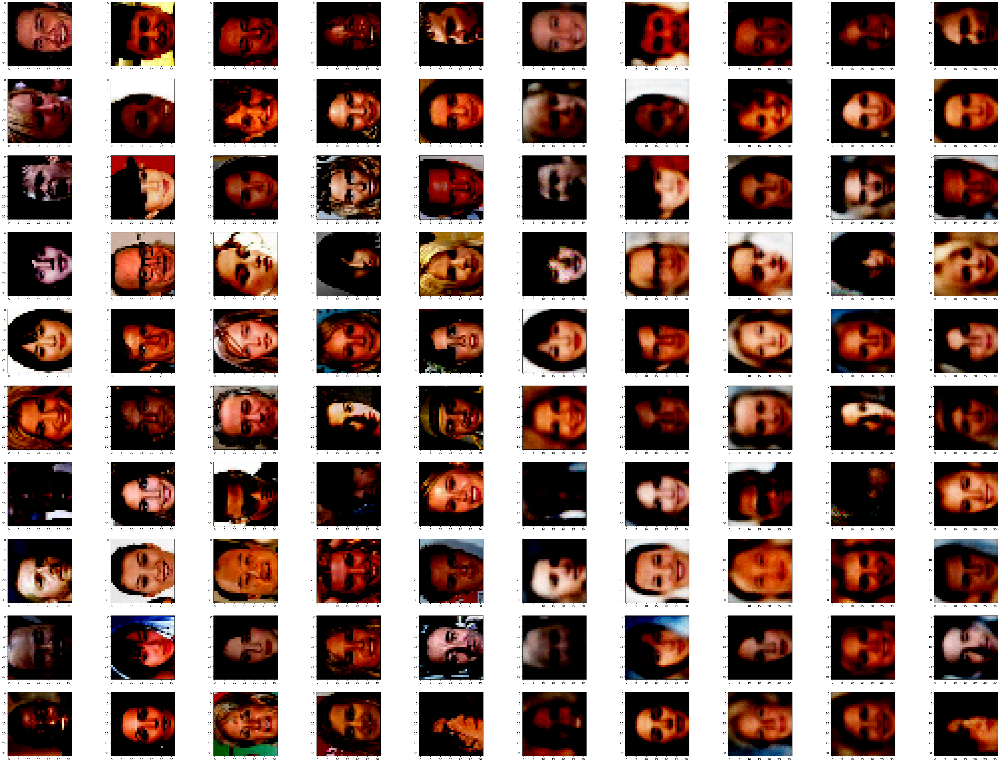

Epoch: 002/002 | Batch 0000/1582 | Loss: 99.8190
Epoch: 002/002 | Batch 0050/1582 | Loss: 90.9935
Epoch: 002/002 | Batch 0100/1582 | Loss: 98.1721
Epoch: 002/002 | Batch 0150/1582 | Loss: 98.8334
Epoch: 002/002 | Batch 0200/1582 | Loss: 97.1310
Epoch: 002/002 | Batch 0250/1582 | Loss: 92.1125
Epoch: 002/002 | Batch 0300/1582 | Loss: 86.6460
Epoch: 002/002 | Batch 0350/1582 | Loss: 97.0828
Epoch: 002/002 | Batch 0400/1582 | Loss: 90.1503
Epoch: 002/002 | Batch 0450/1582 | Loss: 92.4075
Epoch: 002/002 | Batch 0500/1582 | Loss: 85.3282
Epoch: 002/002 | Batch 0550/1582 | Loss: 91.0352
Epoch: 002/002 | Batch 0600/1582 | Loss: 90.7901
Epoch: 002/002 | Batch 0650/1582 | Loss: 86.6253
Epoch: 002/002 | Batch 0700/1582 | Loss: 95.2276
Epoch: 002/002 | Batch 0750/1582 | Loss: 86.1461
Epoch: 002/002 | Batch 0800/1582 | Loss: 82.8853
Epoch: 002/002 | Batch 0850/1582 | Loss: 77.6484
Epoch: 002/002 | Batch 0900/1582 | Loss: 83.7187
Epoch: 002/002 | Batch 0950/1582 | Loss: 83.7519
Epoch: 002/002 | Bat

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

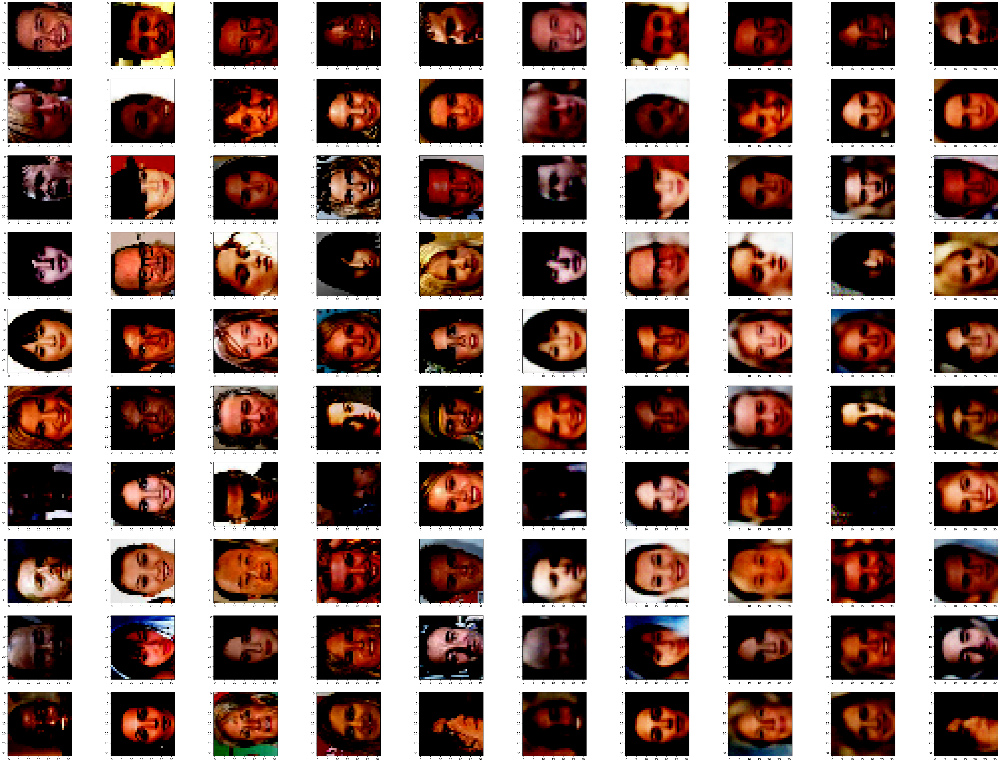

Total Training Time: 21.96 min
END OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAE


In [14]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=2
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001

model1=VAE1(latent_dim=100).to('cuda:0')
model1.load_state_dict(torch.load('./vae1_1.pt'))

for i in model1.parameters():
    i.requires_grad==False

for i in model1.z_log_var.parameters():
    i.requires_grad==True

for i in model1.z_mean.parameters():
    i.requires_grad==True
    
model=VAE2(latent_dim=100).to('cuda:0')
model.gan1 = model1


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')


Epoch: 001/002 | Batch 0000/1582 | Loss: 2309.3037
Epoch: 001/002 | Batch 0050/1582 | Loss: 394.5418
Epoch: 001/002 | Batch 0100/1582 | Loss: 269.1776
Epoch: 001/002 | Batch 0150/1582 | Loss: 226.3296
Epoch: 001/002 | Batch 0200/1582 | Loss: 204.0260
Epoch: 001/002 | Batch 0250/1582 | Loss: 183.5588
Epoch: 001/002 | Batch 0300/1582 | Loss: 158.9501
Epoch: 001/002 | Batch 0350/1582 | Loss: 165.6656
Epoch: 001/002 | Batch 0400/1582 | Loss: 150.9226
Epoch: 001/002 | Batch 0450/1582 | Loss: 155.1093
Epoch: 001/002 | Batch 0500/1582 | Loss: 135.7395
Epoch: 001/002 | Batch 0550/1582 | Loss: 136.7892
Epoch: 001/002 | Batch 0600/1582 | Loss: 134.3566
Epoch: 001/002 | Batch 0650/1582 | Loss: 126.7459
Epoch: 001/002 | Batch 0700/1582 | Loss: 137.7641
Epoch: 001/002 | Batch 0750/1582 | Loss: 123.1111
Epoch: 001/002 | Batch 0800/1582 | Loss: 114.7624
Epoch: 001/002 | Batch 0850/1582 | Loss: 110.7435
Epoch: 001/002 | Batch 0900/1582 | Loss: 114.0857
Epoch: 001/002 | Batch 0950/1582 | Loss: 113.0407

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

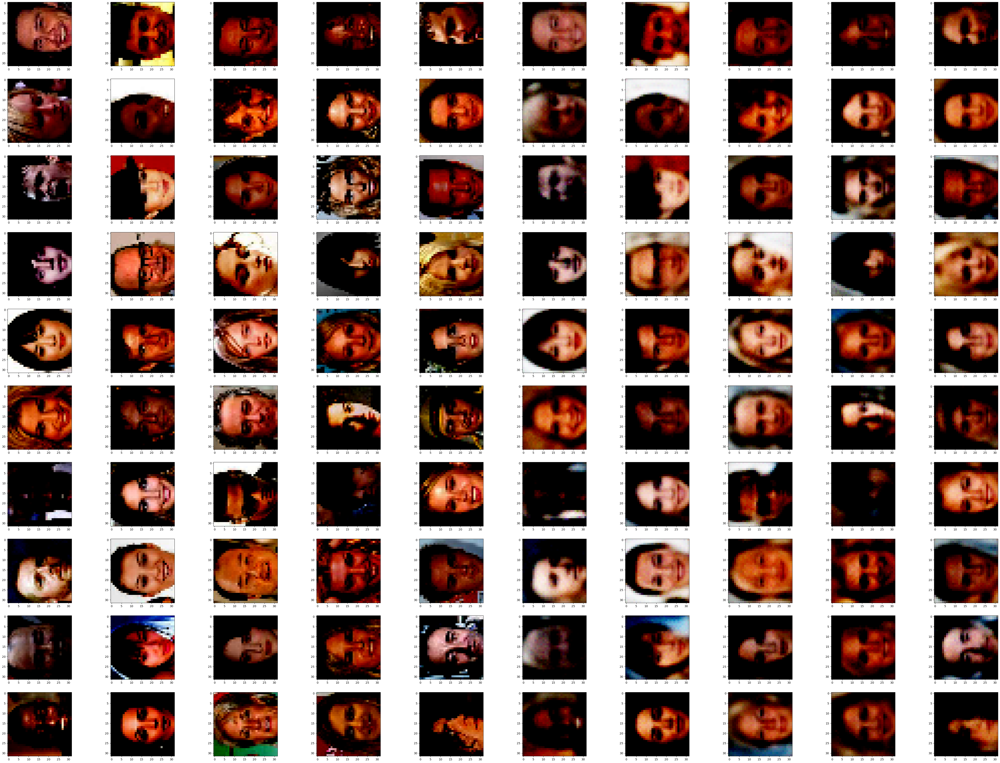

Epoch: 002/002 | Batch 0000/1582 | Loss: 100.6140
Epoch: 002/002 | Batch 0050/1582 | Loss: 90.9062
Epoch: 002/002 | Batch 0100/1582 | Loss: 99.3089
Epoch: 002/002 | Batch 0150/1582 | Loss: 100.8585
Epoch: 002/002 | Batch 0200/1582 | Loss: 99.8988
Epoch: 002/002 | Batch 0250/1582 | Loss: 92.5843
Epoch: 002/002 | Batch 0300/1582 | Loss: 86.2850
Epoch: 002/002 | Batch 0350/1582 | Loss: 98.5051
Epoch: 002/002 | Batch 0400/1582 | Loss: 89.5831
Epoch: 002/002 | Batch 0450/1582 | Loss: 91.7924
Epoch: 002/002 | Batch 0500/1582 | Loss: 85.4927
Epoch: 002/002 | Batch 0550/1582 | Loss: 89.0279
Epoch: 002/002 | Batch 0600/1582 | Loss: 90.8849
Epoch: 002/002 | Batch 0650/1582 | Loss: 87.5446
Epoch: 002/002 | Batch 0700/1582 | Loss: 95.4095
Epoch: 002/002 | Batch 0750/1582 | Loss: 87.1019
Epoch: 002/002 | Batch 0800/1582 | Loss: 85.7595
Epoch: 002/002 | Batch 0850/1582 | Loss: 77.0376
Epoch: 002/002 | Batch 0900/1582 | Loss: 83.9782
Epoch: 002/002 | Batch 0950/1582 | Loss: 85.2318
Epoch: 002/002 | B

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

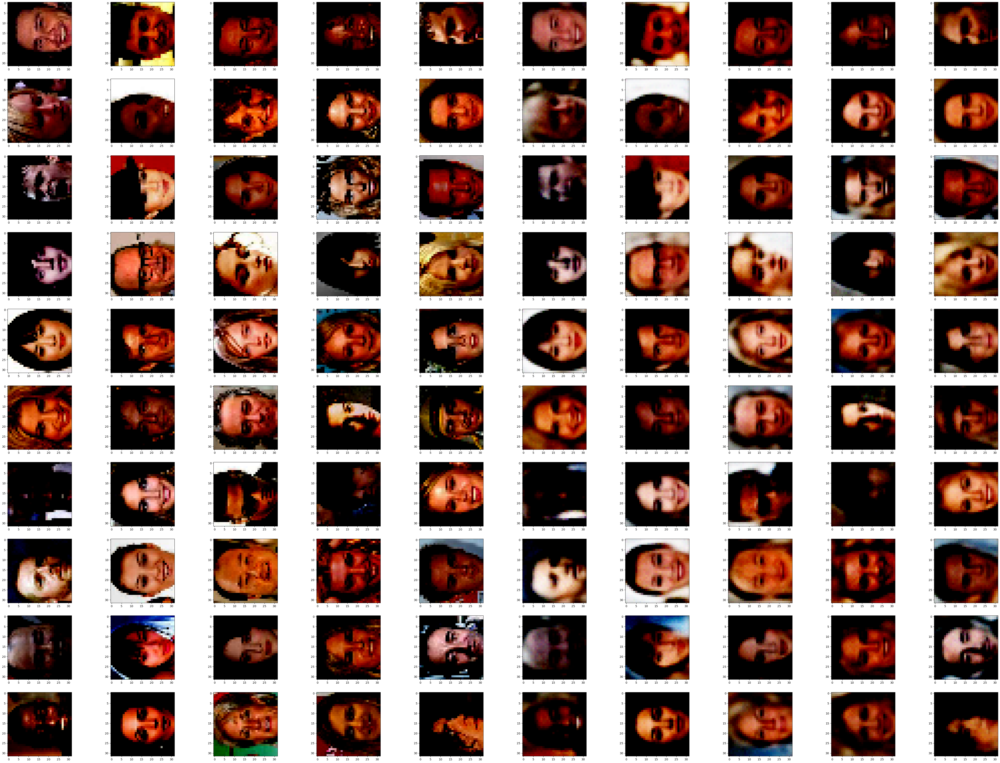

Total Training Time: 18.47 min
END OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAE


In [16]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=2
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001

model1=VAE1(latent_dim=100).to('cuda:0')
model1.load_state_dict(torch.load('./vae1_1.pt'))

for i in model1.parameters():
    i.requires_grad==True
    
model=VAE2(latent_dim=100).to('cuda:0')
model.gan1 = model1


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2_1 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')


In [17]:
model.load_state_dict(torch.load('./vae2_1.pt'))

<All keys matched successfully>

Epoch: 001/002 | Batch 0000/1582 | Loss: 80.4265
Epoch: 001/002 | Batch 0050/1582 | Loss: 74.5793
Epoch: 001/002 | Batch 0100/1582 | Loss: 80.8851
Epoch: 001/002 | Batch 0150/1582 | Loss: 83.6910
Epoch: 001/002 | Batch 0200/1582 | Loss: 81.0391
Epoch: 001/002 | Batch 0250/1582 | Loss: 76.6199
Epoch: 001/002 | Batch 0300/1582 | Loss: 72.2135
Epoch: 001/002 | Batch 0350/1582 | Loss: 82.4331
Epoch: 001/002 | Batch 0400/1582 | Loss: 74.8715
Epoch: 001/002 | Batch 0450/1582 | Loss: 78.3366
Epoch: 001/002 | Batch 0500/1582 | Loss: 72.3308
Epoch: 001/002 | Batch 0550/1582 | Loss: 76.0524
Epoch: 001/002 | Batch 0600/1582 | Loss: 76.7132
Epoch: 001/002 | Batch 0650/1582 | Loss: 73.7646
Epoch: 001/002 | Batch 0700/1582 | Loss: 82.2053
Epoch: 001/002 | Batch 0750/1582 | Loss: 74.8635
Epoch: 001/002 | Batch 0800/1582 | Loss: 71.0240
Epoch: 001/002 | Batch 0850/1582 | Loss: 67.3773
Epoch: 001/002 | Batch 0900/1582 | Loss: 73.1131
Epoch: 001/002 | Batch 0950/1582 | Loss: 72.9470
Epoch: 001/002 | Bat

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

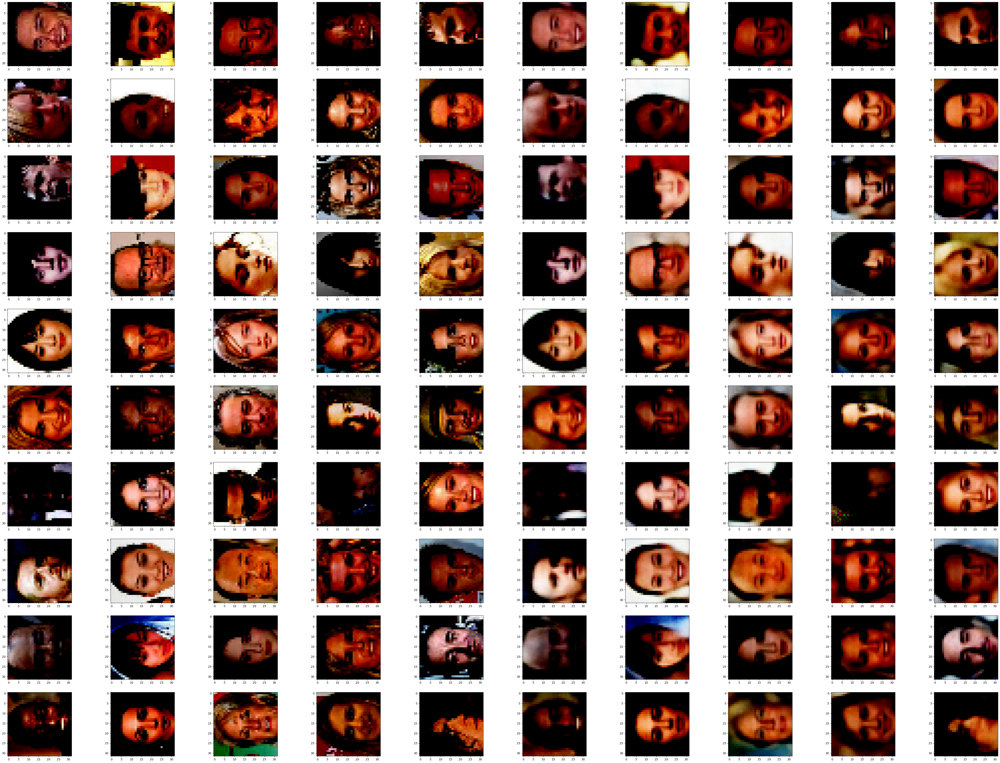

Epoch: 002/002 | Batch 0000/1582 | Loss: 70.1581
Epoch: 002/002 | Batch 0050/1582 | Loss: 65.3427
Epoch: 002/002 | Batch 0100/1582 | Loss: 71.8074
Epoch: 002/002 | Batch 0150/1582 | Loss: 75.1377
Epoch: 002/002 | Batch 0200/1582 | Loss: 72.9683
Epoch: 002/002 | Batch 0250/1582 | Loss: 69.5522
Epoch: 002/002 | Batch 0300/1582 | Loss: 65.6868
Epoch: 002/002 | Batch 0350/1582 | Loss: 74.8115
Epoch: 002/002 | Batch 0400/1582 | Loss: 67.8475
Epoch: 002/002 | Batch 0450/1582 | Loss: 70.2900
Epoch: 002/002 | Batch 0500/1582 | Loss: 65.5456
Epoch: 002/002 | Batch 0550/1582 | Loss: 69.3550
Epoch: 002/002 | Batch 0600/1582 | Loss: 68.4424
Epoch: 002/002 | Batch 0650/1582 | Loss: 68.4167
Epoch: 002/002 | Batch 0700/1582 | Loss: 75.7697
Epoch: 002/002 | Batch 0750/1582 | Loss: 68.6190
Epoch: 002/002 | Batch 0800/1582 | Loss: 66.3394
Epoch: 002/002 | Batch 0850/1582 | Loss: 63.0367
Epoch: 002/002 | Batch 0900/1582 | Loss: 68.7544
Epoch: 002/002 | Batch 0950/1582 | Loss: 67.6519
Epoch: 002/002 | Bat

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

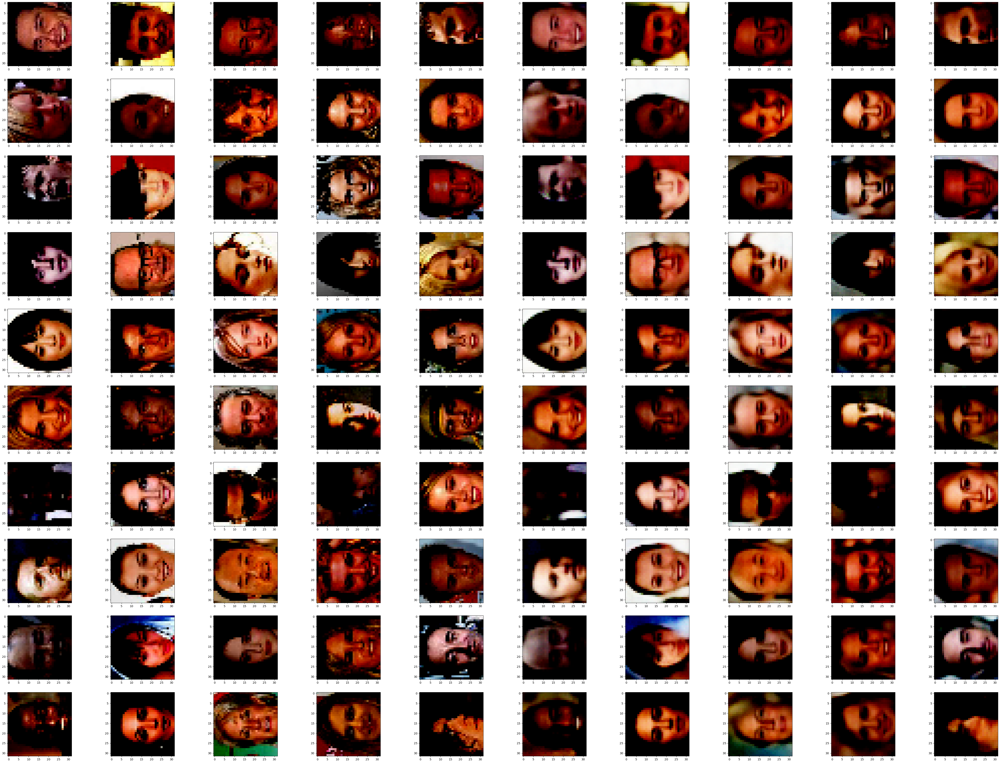

Total Training Time: 18.13 min
END OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAE


In [18]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=2
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001

model1=VAE1(latent_dim=100).to('cuda:0')
model1.load_state_dict(torch.load('./vae1_1.pt'))

for i in model1.parameters():
    i.requires_grad==True
    
model.gan1 = model1


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2_1 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')


Epoch: 001/001 | Batch 0000/1582 | Loss: 64.0858
Epoch: 001/001 | Batch 0050/1582 | Loss: 62.0836
Epoch: 001/001 | Batch 0100/1582 | Loss: 68.0198
Epoch: 001/001 | Batch 0150/1582 | Loss: 71.4991
Epoch: 001/001 | Batch 0200/1582 | Loss: 70.4546
Epoch: 001/001 | Batch 0250/1582 | Loss: 66.6937
Epoch: 001/001 | Batch 0300/1582 | Loss: 63.0742
Epoch: 001/001 | Batch 0350/1582 | Loss: 70.1850
Epoch: 001/001 | Batch 0400/1582 | Loss: 64.7984
Epoch: 001/001 | Batch 0450/1582 | Loss: 66.5265
Epoch: 001/001 | Batch 0500/1582 | Loss: 62.2246
Epoch: 001/001 | Batch 0550/1582 | Loss: 66.0588
Epoch: 001/001 | Batch 0600/1582 | Loss: 65.4598
Epoch: 001/001 | Batch 0650/1582 | Loss: 66.2371
Epoch: 001/001 | Batch 0700/1582 | Loss: 72.1151
Epoch: 001/001 | Batch 0750/1582 | Loss: 65.4839
Epoch: 001/001 | Batch 0800/1582 | Loss: 65.0541
Epoch: 001/001 | Batch 0850/1582 | Loss: 59.6757
Epoch: 001/001 | Batch 0900/1582 | Loss: 64.9636
Epoch: 001/001 | Batch 0950/1582 | Loss: 65.1322
Epoch: 001/001 | Bat

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

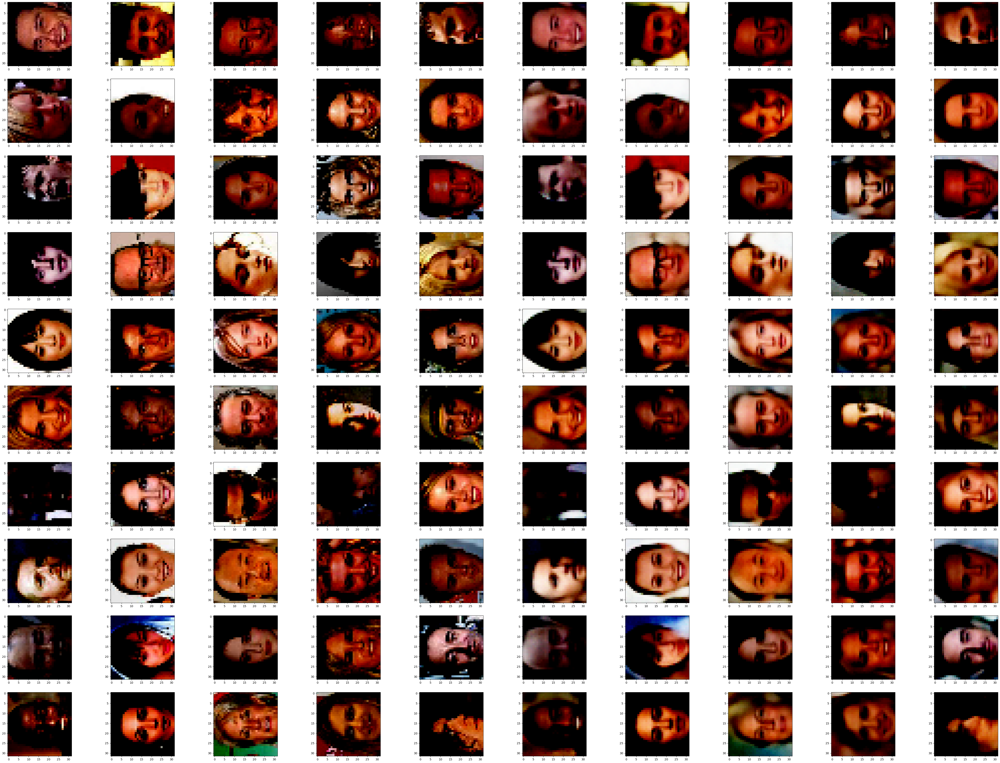

Total Training Time: 9.29 min
Epoch: 001/001 | Batch 0000/1582 | Loss: 61.5989
Epoch: 001/001 | Batch 0050/1582 | Loss: 59.2133
Epoch: 001/001 | Batch 0100/1582 | Loss: 65.2961
Epoch: 001/001 | Batch 0150/1582 | Loss: 68.1758
Epoch: 001/001 | Batch 0200/1582 | Loss: 67.0144
Epoch: 001/001 | Batch 0250/1582 | Loss: 64.0774
Epoch: 001/001 | Batch 0300/1582 | Loss: 61.2015
Epoch: 001/001 | Batch 0350/1582 | Loss: 66.6867
Epoch: 001/001 | Batch 0400/1582 | Loss: 61.6449
Epoch: 001/001 | Batch 0450/1582 | Loss: 63.9498
Epoch: 001/001 | Batch 0500/1582 | Loss: 60.1061
Epoch: 001/001 | Batch 0550/1582 | Loss: 64.2794
Epoch: 001/001 | Batch 0600/1582 | Loss: 61.9927
Epoch: 001/001 | Batch 0650/1582 | Loss: 62.9240
Epoch: 001/001 | Batch 0700/1582 | Loss: 69.8767
Epoch: 001/001 | Batch 0750/1582 | Loss: 63.1240
Epoch: 001/001 | Batch 0800/1582 | Loss: 62.9677
Epoch: 001/001 | Batch 0850/1582 | Loss: 57.8353
Epoch: 001/001 | Batch 0900/1582 | Loss: 62.3943
Epoch: 001/001 | Batch 0950/1582 | Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

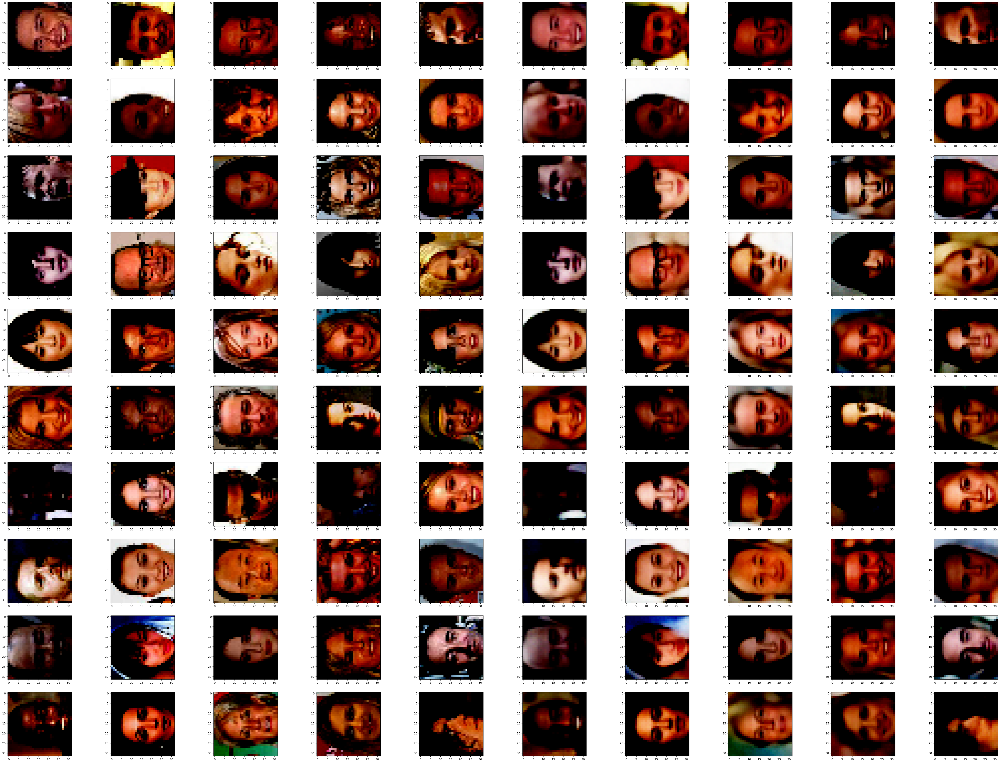

Total Training Time: 9.23 min
Epoch: 001/001 | Batch 0000/1582 | Loss: 59.3647
Epoch: 001/001 | Batch 0050/1582 | Loss: 57.1774
Epoch: 001/001 | Batch 0100/1582 | Loss: 62.8705
Epoch: 001/001 | Batch 0150/1582 | Loss: 65.0533
Epoch: 001/001 | Batch 0200/1582 | Loss: 64.5646
Epoch: 001/001 | Batch 0250/1582 | Loss: 62.0683
Epoch: 001/001 | Batch 0300/1582 | Loss: 59.0778
Epoch: 001/001 | Batch 0350/1582 | Loss: 63.6856
Epoch: 001/001 | Batch 0400/1582 | Loss: 59.6137
Epoch: 001/001 | Batch 0450/1582 | Loss: 62.1485
Epoch: 001/001 | Batch 0500/1582 | Loss: 58.4964
Epoch: 001/001 | Batch 0550/1582 | Loss: 62.3445
Epoch: 001/001 | Batch 0600/1582 | Loss: 59.9361
Epoch: 001/001 | Batch 0650/1582 | Loss: 61.2517
Epoch: 001/001 | Batch 0700/1582 | Loss: 68.2459
Epoch: 001/001 | Batch 0750/1582 | Loss: 61.1502
Epoch: 001/001 | Batch 0800/1582 | Loss: 60.6135
Epoch: 001/001 | Batch 0850/1582 | Loss: 55.9521
Epoch: 001/001 | Batch 0900/1582 | Loss: 60.0674
Epoch: 001/001 | Batch 0950/1582 | Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

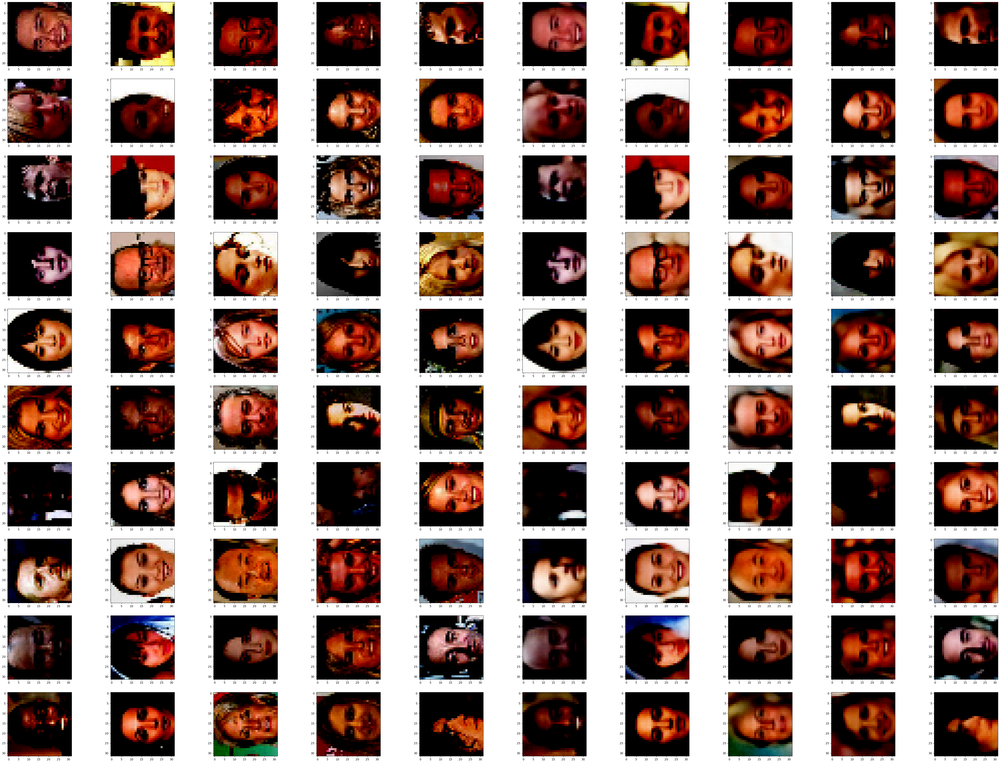

Total Training Time: 9.21 min
END OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAE


In [23]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=1
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001

model1=VAE1(latent_dim=100).to('cuda:0')
model1.load_state_dict(torch.load('./vae1_1.pt'))

for i in model1.parameters():
    i.requires_grad==False
    
for i in model1.generator_3.parameters():
    i.requires_grad==True
    
for i in model1.discriminator_1.parameters():
    i.requires_grad==True
    
for i in model1.z_log_var.parameters():
    i.requires_grad==True
    
for i in model1.z_mean.parameters():
    i.requires_grad==True
    
model.gan1 = model1


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2_3_1 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
                            
for i in model1.generator_2.parameters():
    i.requires_grad==True
    
for i in model1.discriminator_2.parameters():
    i.requires_grad==True
                            

log_dict2_3_2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)

for i in model1.generator_1.parameters():
    i.requires_grad==True
    
for i in model1.discriminator_3.parameters():
    i.requires_grad==True
                        
log_dict2_3_3 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
                        
print(20*'=')
print(20*'END OF VAE')
print(20*'=')


In [21]:
log_dict2

{'train_combined_loss_per_batch': [2424.246337890625,
  2190.005126953125,
  1831.04638671875,
  1506.513427734375,
  1266.5294189453125,
  1137.230712890625,
  1040.354736328125,
  938.27001953125,
  950.5858154296875,
  896.36962890625,
  925.2117309570312,
  877.3087158203125,
  892.4306640625,
  828.8439331054688,
  840.106201171875,
  787.259765625,
  835.74609375,
  810.5680541992188,
  807.5979614257812,
  760.7883911132812,
  751.5980834960938,
  798.7501220703125,
  729.134033203125,
  689.076171875,
  681.6448364257812,
  685.8070068359375,
  671.2933959960938,
  673.3277587890625,
  604.1486206054688,
  607.8775024414062,
  623.5985717773438,
  611.652587890625,
  563.2009887695312,
  589.33154296875,
  552.6792602539062,
  592.53466796875,
  523.7574462890625,
  556.0874633789062,
  548.4730224609375,
  526.9653930664062,
  524.4679565429688,
  464.6296081542969,
  490.56329345703125,
  474.6461486816406,
  486.84521484375,
  457.0628662109375,
  464.46514892578125,
  421.4

Epoch: 001/001 | Batch 0000/1582 | Loss: 2198.1106
Epoch: 001/001 | Batch 0050/1582 | Loss: 419.2397
Epoch: 001/001 | Batch 0100/1582 | Loss: 276.1129
Epoch: 001/001 | Batch 0150/1582 | Loss: 219.1097
Epoch: 001/001 | Batch 0200/1582 | Loss: 179.6032
Epoch: 001/001 | Batch 0250/1582 | Loss: 157.3285
Epoch: 001/001 | Batch 0300/1582 | Loss: 133.4379
Epoch: 001/001 | Batch 0350/1582 | Loss: 137.8963
Epoch: 001/001 | Batch 0400/1582 | Loss: 121.8425
Epoch: 001/001 | Batch 0450/1582 | Loss: 123.6475
Epoch: 001/001 | Batch 0500/1582 | Loss: 109.0127
Epoch: 001/001 | Batch 0550/1582 | Loss: 112.3151
Epoch: 001/001 | Batch 0600/1582 | Loss: 113.1227
Epoch: 001/001 | Batch 0650/1582 | Loss: 104.5276
Epoch: 001/001 | Batch 0700/1582 | Loss: 113.8245
Epoch: 001/001 | Batch 0750/1582 | Loss: 102.5079
Epoch: 001/001 | Batch 0800/1582 | Loss: 98.0553
Epoch: 001/001 | Batch 0850/1582 | Loss: 86.7846
Epoch: 001/001 | Batch 0900/1582 | Loss: 94.5402
Epoch: 001/001 | Batch 0950/1582 | Loss: 94.6727
Epo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

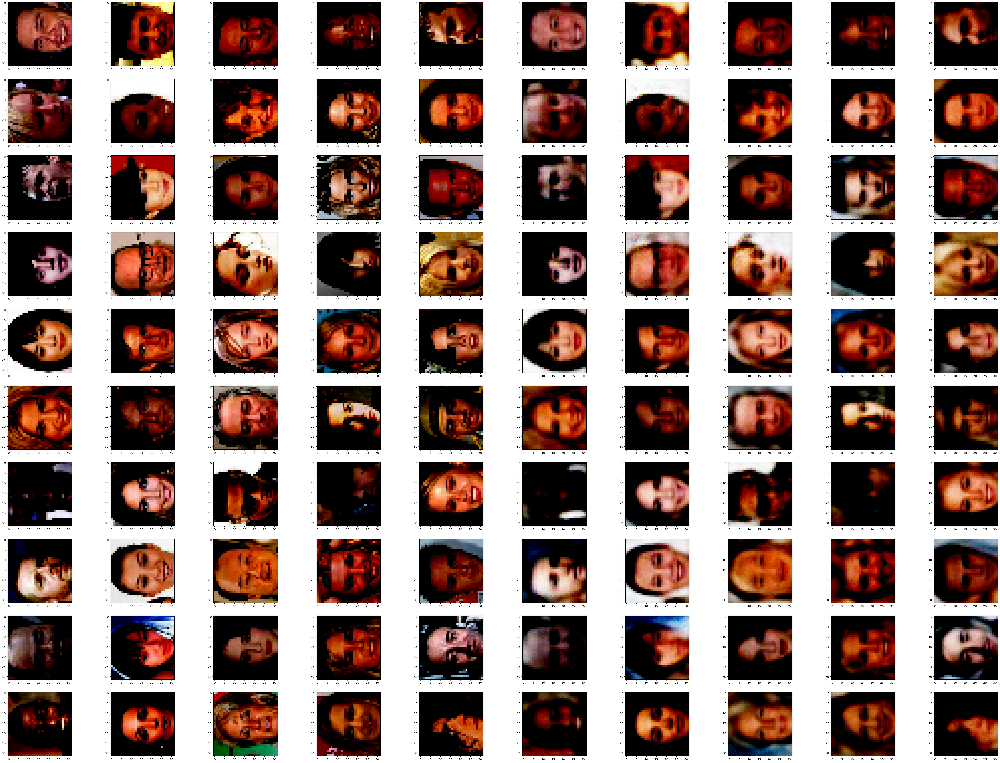

Total Training Time: 10.90 min
END OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAEEND OF VAE


In [27]:
torch.autograd.set_detect_anomaly(True)
model2=model
NUM_EPOCHS=1
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001


model=VUNET(gan1=model1).to('cuda:0')
# model.to(DEVICE)


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')


In [ ]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=1
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001
model=VAE1().to('cuda:0')
# model.to(DEVICE)


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')
model1=model


Epoch: 001/001 | Batch 0000/1582 | Loss: 682.5980
Epoch: 001/001 | Batch 0050/1582 | Loss: 89.9690
Epoch: 001/001 | Batch 0100/1582 | Loss: 60.3731
Epoch: 001/001 | Batch 0150/1582 | Loss: 49.0363
Epoch: 001/001 | Batch 0200/1582 | Loss: 45.9206
Epoch: 001/001 | Batch 0250/1582 | Loss: 38.5993
Epoch: 001/001 | Batch 0300/1582 | Loss: 34.8400
Epoch: 001/001 | Batch 0350/1582 | Loss: 35.6386
Epoch: 001/001 | Batch 0400/1582 | Loss: 32.6601


In [ ]:
model1 = model
model = DCGAN1()
model.to('cpu')
model.discriminator1 = model1.discriminator1
model.generator1 = model1.generator1
model.to('cuda:0')

log_dict = train_gan_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer_gen=o ptim_gen,
#                         optimizer_discr=optim_discr,
                        latent_dim=100,
                        device=DEVICE, 
                        train_loader=train_loader,
                        logging_interval=100,
                        save_model='gan_celeba_01.pt')
                        
d1 = model.to('cpu')
print(20*'=')
print(20*'END OF GAN')
print(20*'=')
# model1.to('cpu')
# model.discriminator1 = model1.discriminator1
# model.to('cuda:0')
# log_dict = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer=optimizer, device=['cuda:0','cuda:0'], 
#                         train_loader=train_loader,
#                         skip_epoch_stats=True,
#                         logging_interval=50)


In [ ]:
model = DCGAN1()
model.to('cuda:0')
model.generator1 = model1.generator1
log_dict = train_gan_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer_gen=o ptim_gen,
#                         optimizer_discr=optim_discr,
                        latent_dim=100,
                        device=DEVICE, 
                        train_loader=train_loader,
                        logging_interval=100,
                        save_model='gan_celeba_01.pt')
                        
d2 = model.to('cpu')

print(20*'=')
print(20*'END OF GAN')
print(20*'=')
# model1.to('cpu')
# model.discriminator1 = model1.discriminator1
# model.to('cuda:0')
# log_dict = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer=optimizer, device=['cuda:0','cuda:0'], 
#                         train_loader=train_loader,
#                         skip_epoch_stats=True,
#                         logging_interval=50)


In [ ]:
model = DCGAN1()
model.to('cuda:0')
log_dict = train_gan_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer_gen=o ptim_gen,
#                         optimizer_discr=optim_discr,
                        latent_dim=100,
                        device=DEVICE, 
                        train_loader=train_loader,
                        logging_interval=100,
                        save_model='gan_celeba_01.pt')

d3 = model.to('cpu')
                        
print(20*'=')
print(20*'END OF GAN')
print(20*'=')
# model1.to('cpu')
# model.discriminator1 = model1.discriminator1
# model.to('cuda:0')
# log_dict = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer=optimizer, device=['cuda:0','cuda:0'], 
#                         train_loader=train_loader,
#                         skip_epoch_stats=True,
#                         logging_interval=50)


In [ ]:
fig, ax = plt.subplots(3,10, figsize=(10,3))
r = torch.randn(10,100,1,1)
img = d1.generator(r).detach().cpu().numpy()
img.astype(int)
for i in range(10): 
    ax[0,i].imshow(img[i].T)
img = d2.generator(r).detach().cpu().numpy()
img.astype(int)
for i in range(10):
    ax[1,i].imshow(img[i].T) 
img = d3.generator(r).detach().cpu().numpy()
img.astype(int)
for i in range(10):
    ax[2,i].imshow(img[i].T) 


In [ ]:
l1 = [2324.4429,403.2629,262.5080,213.5335,190.4486,166.9656,140.6425,152.2487,131.3695,129.6637,115.6661,116.0421,112.9965,108.6153,117.1549,106.1849,99.2346,92.1339,97.2743,97.9872,105.1659,93.9203,92.2732,91.9387,87.0126,83.6185,100.3863,93.6376,87.1860,86.2272,97.5111,85.7780]
l2 = [2258.5408,2376.2552,260.7901,216.4777,200.6696,176.9970,159.9528,166.4468,151.0760,149.4525,133.1486,136.7063,129.4722,126.0376,136.1812,121.5699,115.4342,108.5439,112.6042,112.0330,120.5186,107.0338,104.9980,103.0034,97.7001,94.9685,111.2518,105.4870,97.9134,95.7497,107.1857,94.1740]
plt.plot(np.arange(len(l1)), np.log(np.array(l1)))
plt.plot(np.arange(len(l1)), np.log(np.array(l2)))

In [ ]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=1
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001
model=VAE1().to('cuda:0')
# model.to(DEVICE)


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')
model1=model


In [ ]:
model1 = model
model = DCGAN1()
model.to('cpu')
# model.discriminator1 = model1.discriminator1
model.generator1 = model1.generator1
model.to('cuda:0')

log_dict = train_gan_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer_gen=o ptim_gen,
#                         optimizer_discr=optim_discr,
                        latent_dim=100,
                        device=DEVICE, 
                        train_loader=train_loader,
                        logging_interval=100,
                        save_model='gan_celeba_01.pt')
                        
d1 = model.to('cpu')
print(20*'=')
print(20*'END OF GAN')
print(20*'=')
# model1.to('cpu')
# model.discriminator1 = model1.discriminator1
# model.to('cuda:0')
# log_dict = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
#                         optimizer=optimizer, device=['cuda:0','cuda:0'], 
#                         train_loader=train_loader,
#                         skip_epoch_stats=True,
#                         logging_interval=50)


In [ ]:
model2

In [ ]:
### 
### FVAE  
### 

# model2=model
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=2
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001
model=VAE_GAN1().to('cuda:0')
# model.generator=model1
# model.discriminator=model2.discriminator

model.to(DEVICE[0])


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict = train_vae_gan_v1(num_epochs=NUM_EPOCHS, model=model, 
                         device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')



In [19]:
4194304/128/64/64

8.0

Epoch: 001/010 | Batch 0000/1582 | Loss: 10307.1641
Epoch: 001/010 | Batch 0050/1582 | Loss: 2036.5464
Epoch: 001/010 | Batch 0100/1582 | Loss: 1228.5078
Epoch: 001/010 | Batch 0150/1582 | Loss: 941.9201
Epoch: 001/010 | Batch 0200/1582 | Loss: 875.6646
Epoch: 001/010 | Batch 0250/1582 | Loss: 797.4980
Epoch: 001/010 | Batch 0300/1582 | Loss: 692.2582
Epoch: 001/010 | Batch 0350/1582 | Loss: 747.8068
Epoch: 001/010 | Batch 0400/1582 | Loss: 766.5000
Epoch: 001/010 | Batch 0450/1582 | Loss: 642.0731
Epoch: 001/010 | Batch 0500/1582 | Loss: 554.4495
Epoch: 001/010 | Batch 0550/1582 | Loss: 554.6138
Epoch: 001/010 | Batch 0600/1582 | Loss: 555.7224
Epoch: 001/010 | Batch 0650/1582 | Loss: 505.0293
Epoch: 001/010 | Batch 0700/1582 | Loss: 536.2700
Epoch: 001/010 | Batch 0750/1582 | Loss: 487.6953
Epoch: 001/010 | Batch 0800/1582 | Loss: 442.9953
Epoch: 001/010 | Batch 0850/1582 | Loss: 417.9075
Epoch: 001/010 | Batch 0900/1582 | Loss: 446.3484
Epoch: 001/010 | Batch 0950/1582 | Loss: 438.3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

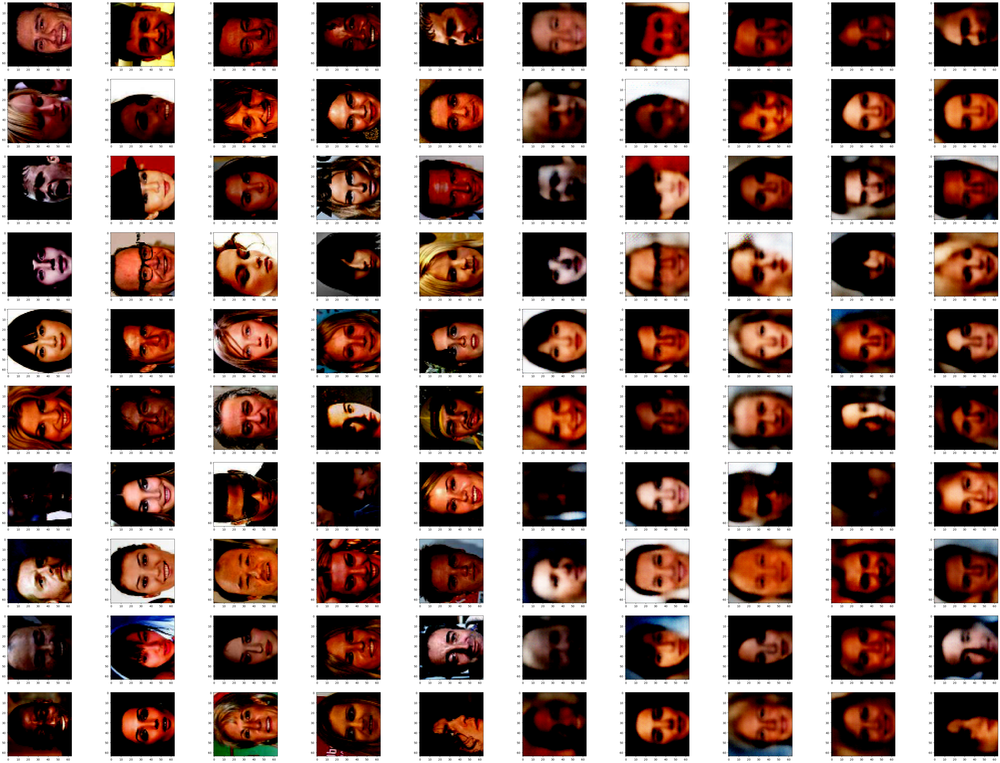

Epoch: 002/010 | Batch 0000/1582 | Loss: 377.7709
Epoch: 002/010 | Batch 0050/1582 | Loss: 341.5472
Epoch: 002/010 | Batch 0100/1582 | Loss: 379.0967
Epoch: 002/010 | Batch 0150/1582 | Loss: 381.3541
Epoch: 002/010 | Batch 0200/1582 | Loss: 365.0179
Epoch: 002/010 | Batch 0250/1582 | Loss: 347.3550
Epoch: 002/010 | Batch 0300/1582 | Loss: 323.7050
Epoch: 002/010 | Batch 0350/1582 | Loss: 365.4635
Epoch: 002/010 | Batch 0400/1582 | Loss: 332.5180
Epoch: 002/010 | Batch 0450/1582 | Loss: 352.1866
Epoch: 002/010 | Batch 0500/1582 | Loss: 321.0275
Epoch: 002/010 | Batch 0550/1582 | Loss: 340.0773
Epoch: 002/010 | Batch 0600/1582 | Loss: 331.8356
Epoch: 002/010 | Batch 0650/1582 | Loss: 322.6020
Epoch: 002/010 | Batch 0700/1582 | Loss: 358.4007
Epoch: 002/010 | Batch 0750/1582 | Loss: 322.2532
Epoch: 002/010 | Batch 0800/1582 | Loss: 311.3105
Epoch: 002/010 | Batch 0850/1582 | Loss: 289.5340
Epoch: 002/010 | Batch 0900/1582 | Loss: 321.5655
Epoch: 002/010 | Batch 0950/1582 | Loss: 310.1469


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

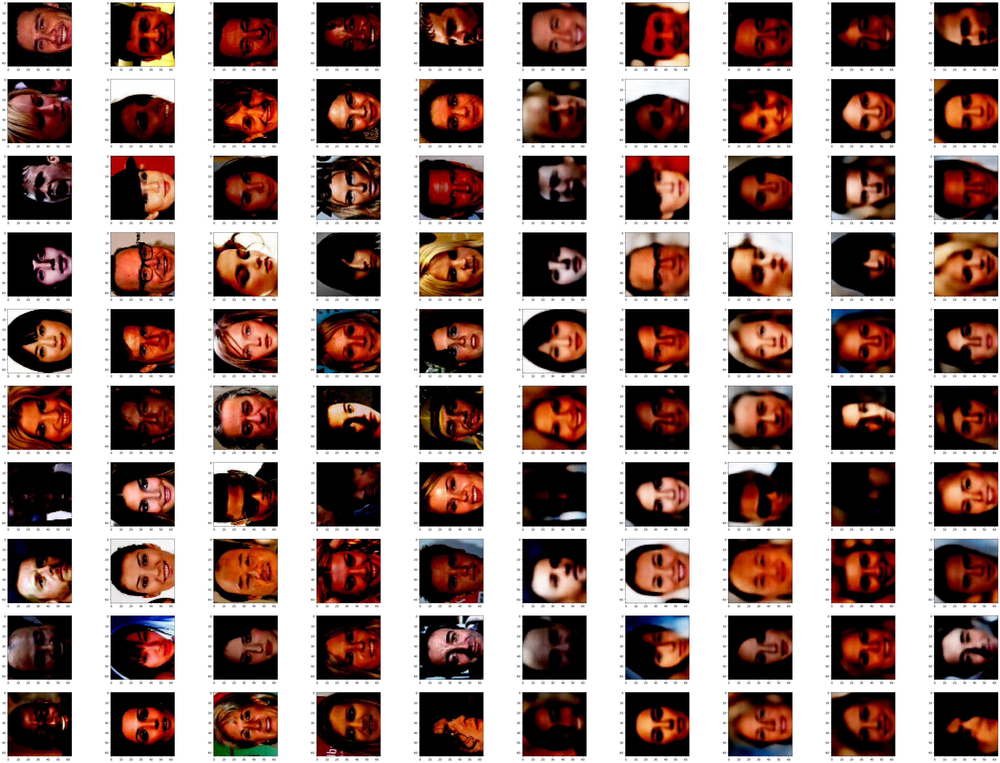

Epoch: 003/010 | Batch 0000/1582 | Loss: 298.0381
Epoch: 003/010 | Batch 0050/1582 | Loss: 275.5547
Epoch: 003/010 | Batch 0100/1582 | Loss: 309.4430
Epoch: 003/010 | Batch 0150/1582 | Loss: 308.8098
Epoch: 003/010 | Batch 0200/1582 | Loss: 298.1482
Epoch: 003/010 | Batch 0250/1582 | Loss: 286.5497
Epoch: 003/010 | Batch 0300/1582 | Loss: 263.4014
Epoch: 003/010 | Batch 0350/1582 | Loss: 299.9907
Epoch: 003/010 | Batch 0400/1582 | Loss: 274.5117
Epoch: 003/010 | Batch 0450/1582 | Loss: 291.7330
Epoch: 003/010 | Batch 0500/1582 | Loss: 266.6783
Epoch: 003/010 | Batch 0550/1582 | Loss: 285.4155
Epoch: 003/010 | Batch 0600/1582 | Loss: 277.3906
Epoch: 003/010 | Batch 0650/1582 | Loss: 272.3395
Epoch: 003/010 | Batch 0700/1582 | Loss: 304.9714
Epoch: 003/010 | Batch 0750/1582 | Loss: 271.9276
Epoch: 003/010 | Batch 0800/1582 | Loss: 264.1936
Epoch: 003/010 | Batch 0850/1582 | Loss: 248.9393
Epoch: 003/010 | Batch 0900/1582 | Loss: 273.7299
Epoch: 003/010 | Batch 0950/1582 | Loss: 268.0240


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

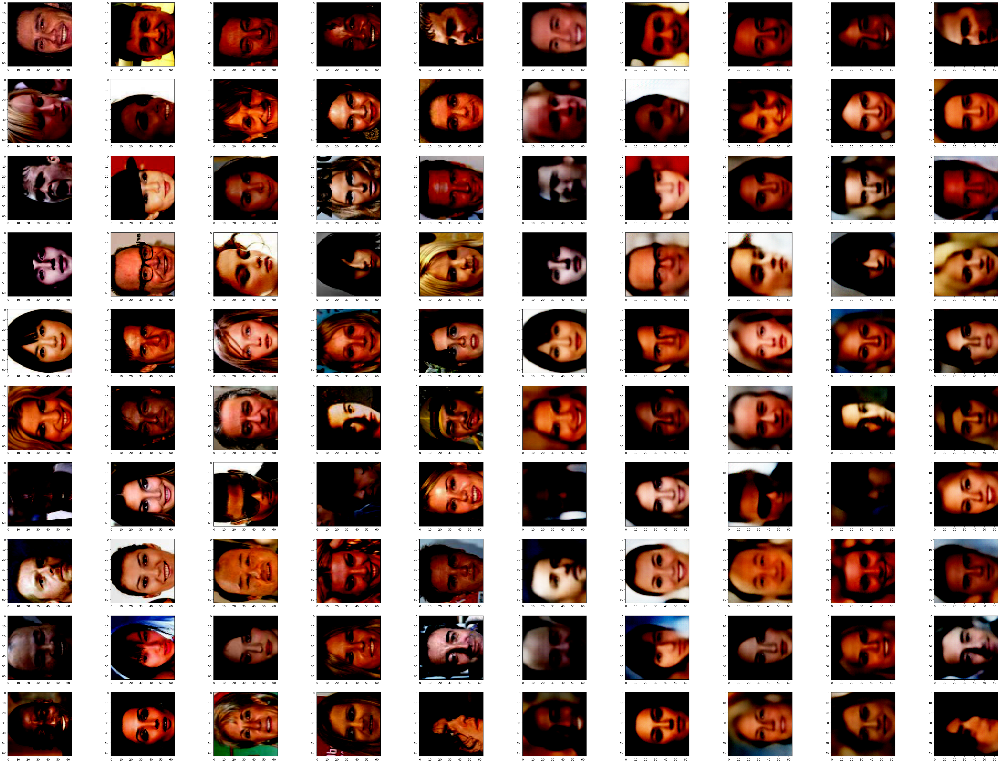

Epoch: 004/010 | Batch 0000/1582 | Loss: 258.1327
Epoch: 004/010 | Batch 0050/1582 | Loss: 241.8037
Epoch: 004/010 | Batch 0100/1582 | Loss: 266.3520
Epoch: 004/010 | Batch 0150/1582 | Loss: 276.8288
Epoch: 004/010 | Batch 0200/1582 | Loss: 269.8297
Epoch: 004/010 | Batch 0250/1582 | Loss: 258.1981
Epoch: 004/010 | Batch 0300/1582 | Loss: 237.9797
Epoch: 004/010 | Batch 0350/1582 | Loss: 264.2791
Epoch: 004/010 | Batch 0400/1582 | Loss: 244.9946
Epoch: 004/010 | Batch 0450/1582 | Loss: 263.2754
Epoch: 004/010 | Batch 0500/1582 | Loss: 240.9301
Epoch: 004/010 | Batch 0550/1582 | Loss: 255.1879
Epoch: 004/010 | Batch 0600/1582 | Loss: 250.1493
Epoch: 004/010 | Batch 0650/1582 | Loss: 247.9827
Epoch: 004/010 | Batch 0700/1582 | Loss: 278.1760
Epoch: 004/010 | Batch 0750/1582 | Loss: 246.9717
Epoch: 004/010 | Batch 0800/1582 | Loss: 241.7507
Epoch: 004/010 | Batch 0850/1582 | Loss: 228.4498
Epoch: 004/010 | Batch 0900/1582 | Loss: 253.1759
Epoch: 004/010 | Batch 0950/1582 | Loss: 245.7966


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

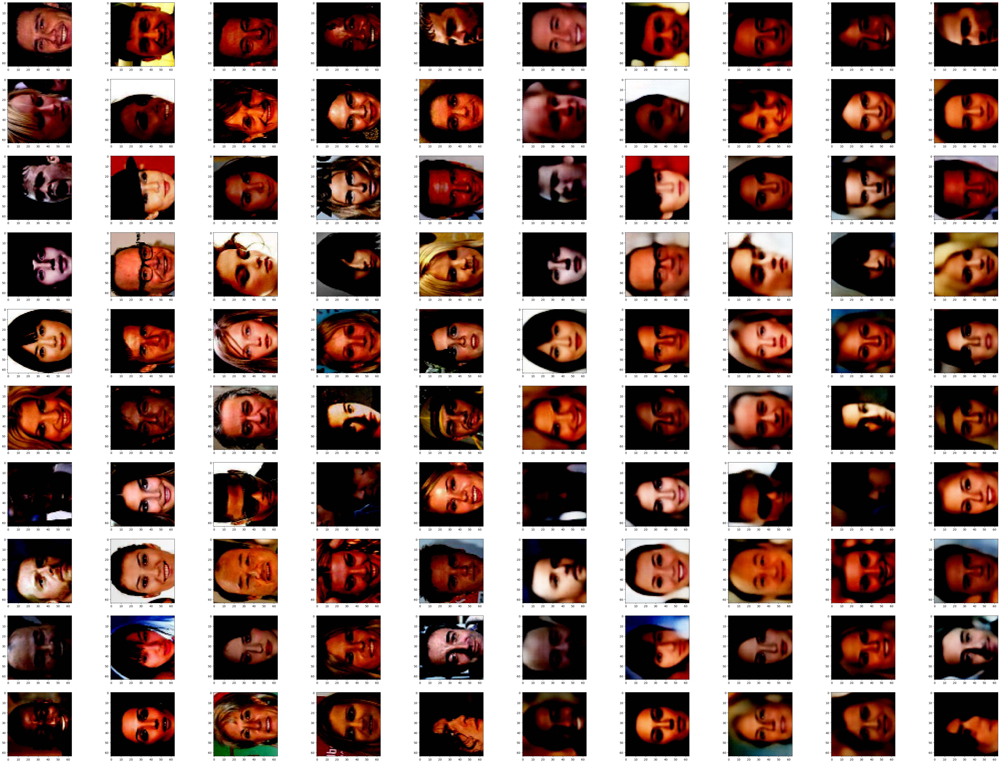

Epoch: 005/010 | Batch 0000/1582 | Loss: 237.3585
Epoch: 005/010 | Batch 0050/1582 | Loss: 225.3491
Epoch: 005/010 | Batch 0100/1582 | Loss: 246.1083
Epoch: 005/010 | Batch 0150/1582 | Loss: 263.7064
Epoch: 005/010 | Batch 0200/1582 | Loss: 255.3230
Epoch: 005/010 | Batch 0250/1582 | Loss: 246.0587
Epoch: 005/010 | Batch 0300/1582 | Loss: 226.3944
Epoch: 005/010 | Batch 0350/1582 | Loss: 246.3495
Epoch: 005/010 | Batch 0400/1582 | Loss: 229.8100
Epoch: 005/010 | Batch 0450/1582 | Loss: 246.2969
Epoch: 005/010 | Batch 0500/1582 | Loss: 229.7340
Epoch: 005/010 | Batch 0550/1582 | Loss: 243.1690
Epoch: 005/010 | Batch 0600/1582 | Loss: 236.5056
Epoch: 005/010 | Batch 0650/1582 | Loss: 238.6853
Epoch: 005/010 | Batch 0700/1582 | Loss: 263.6240
Epoch: 005/010 | Batch 0750/1582 | Loss: 237.5739
Epoch: 005/010 | Batch 0800/1582 | Loss: 235.5515
Epoch: 005/010 | Batch 0850/1582 | Loss: 218.3451
Epoch: 005/010 | Batch 0900/1582 | Loss: 242.2485
Epoch: 005/010 | Batch 0950/1582 | Loss: 237.3793


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

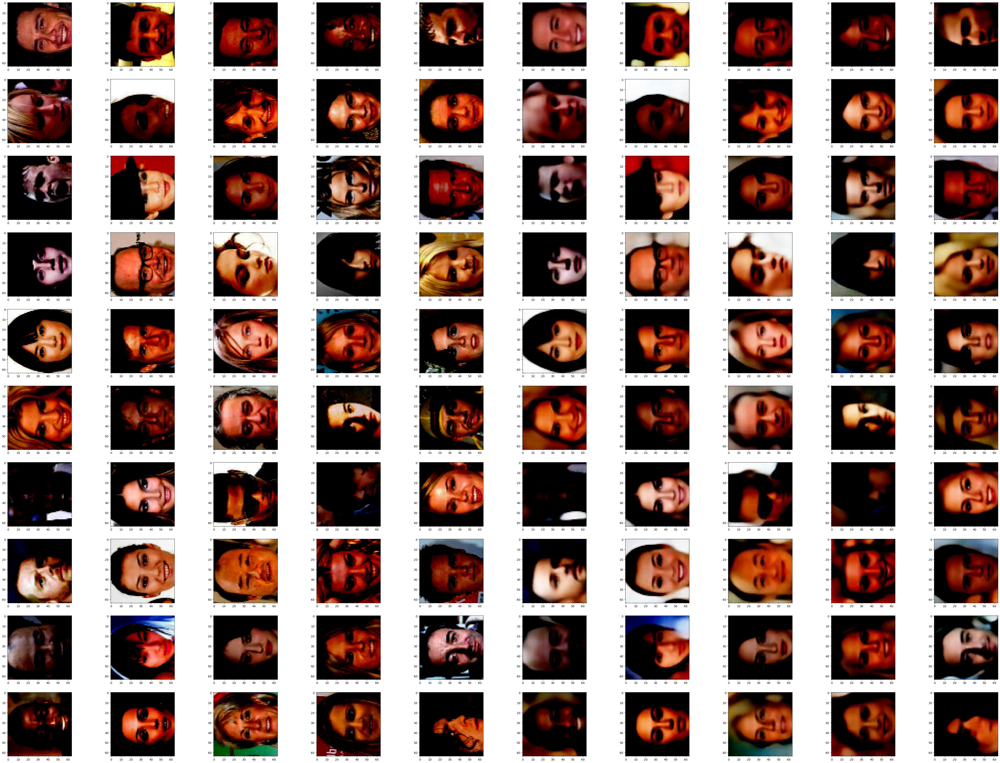

Epoch: 006/010 | Batch 0000/1582 | Loss: 228.6638
Epoch: 006/010 | Batch 0050/1582 | Loss: 218.4448
Epoch: 006/010 | Batch 0100/1582 | Loss: 247.0532
Epoch: 006/010 | Batch 0150/1582 | Loss: 253.4924
Epoch: 006/010 | Batch 0200/1582 | Loss: 249.4328
Epoch: 006/010 | Batch 0250/1582 | Loss: 235.1920
Epoch: 006/010 | Batch 0300/1582 | Loss: 217.2301
Epoch: 006/010 | Batch 0350/1582 | Loss: 237.3866
Epoch: 006/010 | Batch 0400/1582 | Loss: 221.8876
Epoch: 006/010 | Batch 0450/1582 | Loss: 234.7390
Epoch: 006/010 | Batch 0500/1582 | Loss: 219.9786
Epoch: 006/010 | Batch 0550/1582 | Loss: 234.7454
Epoch: 006/010 | Batch 0600/1582 | Loss: 227.2626
Epoch: 006/010 | Batch 0650/1582 | Loss: 231.6444
Epoch: 006/010 | Batch 0700/1582 | Loss: 260.6233
Epoch: 006/010 | Batch 0750/1582 | Loss: 228.2487
Epoch: 006/010 | Batch 0800/1582 | Loss: 231.6519
Epoch: 006/010 | Batch 0850/1582 | Loss: 211.3937
Epoch: 006/010 | Batch 0900/1582 | Loss: 231.6626
Epoch: 006/010 | Batch 0950/1582 | Loss: 229.6887


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

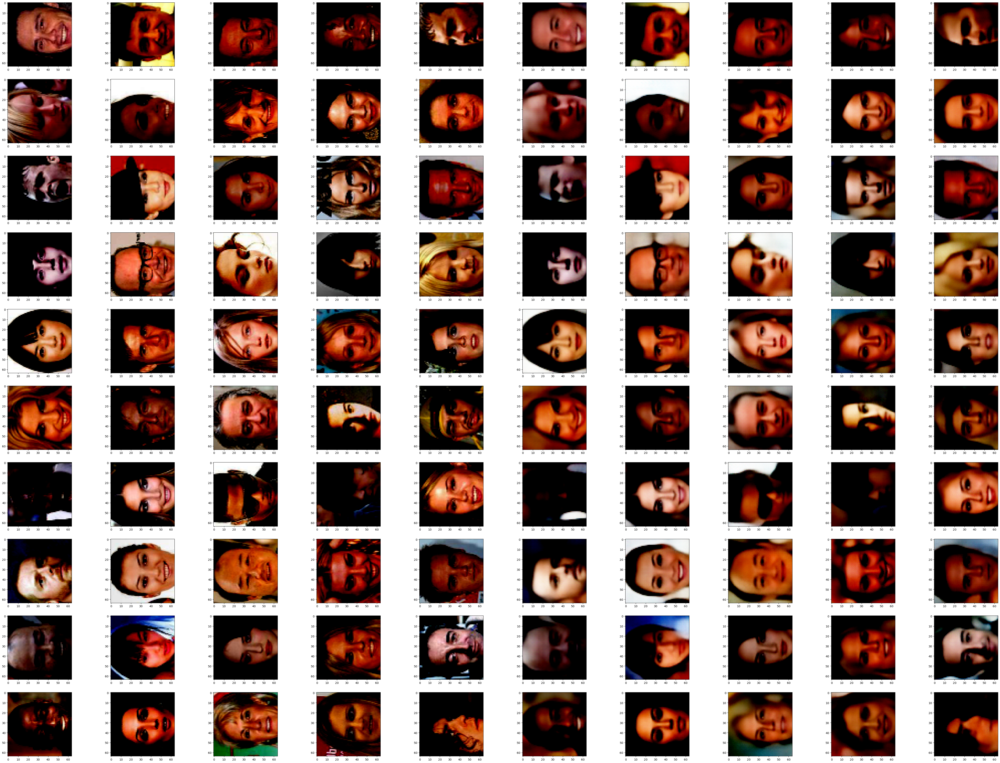

Epoch: 007/010 | Batch 0000/1582 | Loss: 217.5980
Epoch: 007/010 | Batch 0050/1582 | Loss: 210.9342
Epoch: 007/010 | Batch 0100/1582 | Loss: 235.0846
Epoch: 007/010 | Batch 0150/1582 | Loss: 242.5845
Epoch: 007/010 | Batch 0200/1582 | Loss: 238.0471
Epoch: 007/010 | Batch 0250/1582 | Loss: 225.7744
Epoch: 007/010 | Batch 0300/1582 | Loss: 210.1289
Epoch: 007/010 | Batch 0350/1582 | Loss: 231.2532
Epoch: 007/010 | Batch 0400/1582 | Loss: 215.8626
Epoch: 007/010 | Batch 0450/1582 | Loss: 225.3885
Epoch: 007/010 | Batch 0500/1582 | Loss: 211.9067


KeyboardInterrupt: 

In [87]:
torch.autograd.set_detect_anomaly(True)
NUM_EPOCHS=10
DEVICE = ['cuda:0','cuda:0']
LEARNING_RATE = 0.0001
model=VAE3().to('cuda:0')


optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE) 
log_dict2 = train_vae_v1(num_epochs=NUM_EPOCHS, model=model, 
                        optimizer=optimizer, device=['cuda:0','cuda:0'], 
                        train_loader=train_loader,
                        skip_epoch_stats=True,
                        logging_interval=50)
print(20*'=')
print(20*'END OF VAE')
print(20*'=')
model1=model


In [ ]:
torch.save(model.state_dict(),'./test_64x64_epoch-6.pt')